---
Goal: Pesudo-bulk Analysis on raw data 

Perv: 01_Hill_AF_QC_comparison_preprocessing.ipynb (importing QC analaysis and merging )

Next: NA

---

---
# 1- Import data

In [8]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import os

# Set up plotting parameters
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100, facecolor='white', frameon=False)
sns.set_style("whitegrid")

# Define paths
output_base = "/work/archive/farhadie/public_studies/Hill/QC_comparison_analysis/Qclus"
data_dir = os.path.join(output_base, 'processed_data')
results_dir = os.path.join(output_base, 'results')
figures_dir = os.path.join(output_base, 'figures')

# Find the most recent merged file
print("="*60)
print("Loading Merged Data")
print("="*60)

adata_merged = sc.read_h5ad("/work/archive/farhadie/public_studies/Hill/QC_comparison_analysis/processed_data/Hill_merged_with_QC_flags_20251017.h5ad")

print(f"\n✓ Data loaded successfully!")
print(f"\n{'='*60}")
print("AnnData Object Summary:")
print(f"{'='*60}")
print(adata_merged)

# Display basic statistics
print(f"\n{'='*60}")
print("Dataset Statistics:")
print(f"{'='*60}")
print(f"  Total cells: {adata_merged.n_obs:,}")
print(f"  Total genes: {adata_merged.n_vars:,}")
print(f"  Samples: {adata_merged.obs['sample_id'].nunique()}")

# AF status distribution
print(f"\n  AF Status:")
for status, count in adata_merged.obs['af_status'].value_counts().items():
    print(f"{status}: {count:,} cells ({count/adata_merged.n_obs*100:.1f}%)")

# Sex distribution
print(f"\n  Sex:")
for sex, count in adata_merged.obs['sex'].value_counts().items():
    print(f"{sex}: {count:,} cells ({count/adata_merged.n_obs*100:.1f}%)")

# Check available QC flags
print(f"\n{'='*60}")
print("Available QC Flags:")
print(f"{'='*60}")
qc_flags = [col for col in adata_merged.obs.columns if 'flag' in col]
for flag in sorted(qc_flags):
    n_flagged = adata_merged.obs[flag].sum()
    print(f"  {flag}: {n_flagged:,} ({n_flagged/adata_merged.n_obs*100:.1f}%)")

# Check available metadata columns
print(f"\n{'='*60}")
print("Metadata Columns in .obs:")
print(f"{'='*60}")
print(adata_merged.obs.columns.tolist())

# Check if QC metrics are available
print(f"\n{'='*60}")
print("QC Metrics Available:")
print(f"{'='*60}")
qc_metrics = ['total_counts', 'n_genes_by_counts', 'pct_counts_mt', 
  'log1p_total_counts', 'log1p_n_genes_by_counts']

# Memory usage
print(f"\n{'='*60}")
print("Memory Usage:")
print(f"{'='*60}")
memory_mb = adata_merged.X.data.nbytes / (1024 * 1024) if hasattr(adata_merged.X, 'data') else adata_merged.X.nbytes / (1024 * 1024)
print(f"  Matrix size: {memory_mb:.1f} MB")

# Create a backup copy (optional)
print(f"\n{'='*60}")
print("Creating backup copy for safety...")
print(f"{'='*60}")
adata_backup = adata_merged.copy()
print("✓ Backup created: adata_backup")

/opt/micromamba/envs/shortcake_default/lib/python3.10/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


Loading Merged Data

✓ Data loaded successfully!

AnnData Object Summary:
AnnData object with n_obs × n_vars = 262003 × 38606
    obs: 'fraction_unspliced', 'n_genes_by_counts', 'total_counts', 'total_counts_nuclear', 'pct_counts_nuclear', 'score_nuclear', 'total_counts_MT', 'pct_counts_MT', 'score_MT', 'total_counts_CM_cyto', 'pct_counts_CM_cyto', 'score_CM_cyto', 'total_counts_CM_nucl', 'pct_counts_CM_nucl', 'score_CM_nucl', 'total_counts_VEC', 'pct_counts_VEC', 'score_VEC', 'total_counts_PER', 'pct_counts_PER', 'score_PER', 'total_counts_SMC', 'pct_counts_SMC', 'score_SMC', 'total_counts_AD', 'pct_counts_AD', 'score_AD', 'total_counts_SC', 'pct_counts_SC', 'score_SC', 'total_counts_N', 'pct_counts_N', 'score_N', 'total_counts_EEC', 'pct_counts_EEC', 'score_EEC', 'total_counts_FB', 'pct_counts_FB', 'score_FB', 'total_counts_L', 'pct_counts_L', 'score_L', 'total_counts_MESO', 'pct_counts_MESO', 'score_MESO', 'total_counts_MP', 'pct_counts_MP', 'score_MP', 'pct_counts_nonCM', 'kmeans',

---
# 2- Fillter Out

In [9]:
adata_merged = adata_merged[adata_merged.obs.qclus=="passed"]
adata_merged

View of AnnData object with n_obs × n_vars = 148637 × 38606
    obs: 'fraction_unspliced', 'n_genes_by_counts', 'total_counts', 'total_counts_nuclear', 'pct_counts_nuclear', 'score_nuclear', 'total_counts_MT', 'pct_counts_MT', 'score_MT', 'total_counts_CM_cyto', 'pct_counts_CM_cyto', 'score_CM_cyto', 'total_counts_CM_nucl', 'pct_counts_CM_nucl', 'score_CM_nucl', 'total_counts_VEC', 'pct_counts_VEC', 'score_VEC', 'total_counts_PER', 'pct_counts_PER', 'score_PER', 'total_counts_SMC', 'pct_counts_SMC', 'score_SMC', 'total_counts_AD', 'pct_counts_AD', 'score_AD', 'total_counts_SC', 'pct_counts_SC', 'score_SC', 'total_counts_N', 'pct_counts_N', 'score_N', 'total_counts_EEC', 'pct_counts_EEC', 'score_EEC', 'total_counts_FB', 'pct_counts_FB', 'score_FB', 'total_counts_L', 'pct_counts_L', 'score_L', 'total_counts_MESO', 'pct_counts_MESO', 'score_MESO', 'total_counts_MP', 'pct_counts_MP', 'score_MP', 'pct_counts_nonCM', 'kmeans', 'qclus', 'sample_id', 'donor_id', 'sex', 'af_status', 'log1p_n_ge

---
# 3- Preprocessing for UMAP

In [11]:
print("="*60)
print("Starting Preprocessing Pipeline (Memory Optimized)")
print("="*60)
print(f"\nStarting with {adata_merged.n_obs:,} cells and {adata_merged.n_vars:,} genes")

# Make a working copy
adata = adata_merged.copy()

# ====================================================================
# Step 1: Basic filtering on genes (NOT cells)
# ====================================================================
print(f"\n{'='*60}")
print("Step 1: Gene Filtering")
print(f"{'='*60}")

# Keep genes expressed in at least 3 cells
sc.pp.filter_genes(adata, min_cells=3)
print(f"  Genes after min_cells filter: {adata.n_vars:,}")

# ====================================================================
# Step 2: Normalization
# ====================================================================
print(f"\n{'='*60}")
print("Step 2: Normalization")
print(f"{'='*60}")

# Store raw counts for later use
adata.layers['counts'] = adata.X.copy()
print("  ✓ Raw counts saved to .layers['counts']")

# Normalize to 10,000 counts per cell
sc.pp.normalize_total(adata, target_sum=1e4)
print("  ✓ Normalized to 10,000 counts per cell")

# Log transform
sc.pp.log1p(adata)
print("  ✓ Log1p transformation applied")

# ====================================================================
# Step 3: Highly Variable Genes Selection
# ====================================================================
print(f"\n{'='*60}")
print("Step 3: Highly Variable Genes")
print(f"{'='*60}")

# Identify highly variable genes
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=2000,
    batch_key='sample_id',
    flavor='seurat_v3',
    subset=False
)

n_hvg = adata.var['highly_variable'].sum()
print(f"  Highly variable genes identified: {n_hvg}")

# Save a copy before scaling
adata.raw = adata
print("  ✓ Unscaled data saved to .raw")

# ====================================================================
# Step 4: Subset to HVGs and Scale (MEMORY EFFICIENT)
# ====================================================================
print(f"\n{'='*60}")
print("Step 4: Subsetting to HVGs and Scaling")
print(f"{'='*60}")

# IMPORTANT: Subset to HVGs BEFORE scaling to save memory
adata_hvg = adata[:, adata.var['highly_variable']].copy()
print(f"  ✓ Subset to {adata_hvg.n_vars} highly variable genes")

# NOW scale only the HVGs (much smaller matrix)
# Skip regress_out to save memory - batch correction will handle this
sc.pp.scale(adata_hvg, max_value=10)
print(f"  ✓ Scaled HVGs to unit variance (max_value=10)")
print(f"  ⚠️  Skipped regress_out to conserve memory - Harmony will handle batch effects")

# ====================================================================
# Step 5: PCA
# ====================================================================
print(f"\n{'='*60}")
print("Step 5: PCA")
print(f"{'='*60}")

# Run PCA on the scaled HVGs
sc.tl.pca(adata_hvg, svd_solver='arpack', n_comps=50)
print(f"  ✓ PCA computed with 50 components")

# Transfer PCA to original object
adata.obsm['X_pca'] = adata_hvg.obsm['X_pca']
adata.uns['pca'] = adata_hvg.uns['pca']
adata.varm['PCs'] = np.zeros((adata.n_vars, 50))
adata.varm['PCs'][adata.var['highly_variable'], :] = adata_hvg.varm['PCs']

# Plot variance ratio
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
variance_ratio = adata.uns['pca']['variance_ratio']
ax.plot(range(1, len(variance_ratio) + 1), variance_ratio, 'o-')
ax.set_xlabel('PC')
ax.set_ylabel('Variance Ratio')
ax.set_title('PCA Variance Ratio')
ax.set_yscale('log')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, '01_pca_variance_ratio.png'), dpi=300, bbox_inches='tight')
plt.close()
print(f"  ✓ PCA variance plot saved")

# Clean up to save memory
del adata_hvg
import gc
gc.collect()
print(f"  ✓ Memory cleanup done")

# ====================================================================
# Step 6: Batch Correction with Harmony
# ====================================================================
print(f"\n{'='*60}")
print("Step 6: Batch Correction (Harmony)")
print(f"{'='*60}")

try:
    import harmonypy
    
    # Run Harmony integration
    sc.external.pp.harmony_integrate(
        adata,
        key='sample_id',
        basis='X_pca',
        adjusted_basis='X_pca_harmony',
        max_iter_harmony=20
    )
    print(f"  ✓ Harmony batch correction completed")
    pca_key = 'X_pca_harmony'
    
except ImportError:
    print("  ⚠️  harmonypy not available, using uncorrected PCA")
    pca_key = 'X_pca'
except Exception as e:
    print(f"  ⚠️  Harmony failed: {e}")
    print(f"  Using uncorrected PCA")
    pca_key = 'X_pca'

# ====================================================================
# Step 7: Neighbor Graph
# ====================================================================
print(f"\n{'='*60}")
print("Step 7: Computing Neighbor Graph")
print(f"{'='*60}")

# Compute neighbors
sc.pp.neighbors(
    adata,
    n_neighbors=15,
    n_pcs=30,
    use_rep=pca_key,
    metric='cosine'
)
print(f"  ✓ Neighbor graph computed (n_neighbors=15, n_pcs=30)")

# ====================================================================
# Step 8: UMAP
# ====================================================================
print(f"\n{'='*60}")
print("Step 8: UMAP Embedding")
print(f"{'='*60}")

# Compute UMAP
sc.tl.umap(adata, min_dist=0.3, spread=1.0)
print(f"  ✓ UMAP computed")

# ====================================================================
# Step 9: Leiden Clustering (for reference)
# ====================================================================
print(f"\n{'='*60}")
print("Step 9: Leiden Clustering")
print(f"{'='*60}")

# Run Leiden clustering at different resolutions
for resolution in [0.5, 1.0, 1.5]:
    sc.tl.leiden(adata, resolution=resolution, key_added=f'leiden_res{resolution}')
    n_clusters = adata.obs[f'leiden_res{resolution}'].nunique()
    print(f"  Resolution {resolution}: {n_clusters} clusters")

# ====================================================================
# Summary
# ====================================================================
print(f"\n{'='*60}")
print("Preprocessing Complete!")
print(f"{'='*60}")
print(f"  Final cells: {adata.n_obs:,}")
print(f"  Final genes: {adata.n_vars:,}")
print(f"  HVGs: {adata.var['highly_variable'].sum()}")
print(f"  PCA components: {adata.obsm['X_pca'].shape[1]}")
print(f"  UMAP computed: {'X_umap' in adata.obsm}")
print(f"  Batch correction used: {pca_key}")

# Save preprocessed data
preprocessed_file = os.path.join(data_dir, f'Hill_preprocessed_with_UMAP_{datetime.now().strftime("%Y%m%d")}.h5ad')
adata.write_h5ad(preprocessed_file)
print(f"\n✓ Preprocessed data saved to:")
print(f"  {preprocessed_file}")

# Quick visualization - Basic UMAP
print(f"\n{'='*60}")
print("Creating Basic UMAP Visualizations")
print(f"{'='*60}")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Sample ID
sc.pl.umap(adata, color='sample_id', ax=axes[0,0], show=False, 
           legend_fontsize=4, title='Sample ID', frameon=False)

# AF status
sc.pl.umap(adata, color='af_status', ax=axes[0,1], show=False, title='AF Status', 
           palette={'case': 'red', 'control': 'blue'}, frameon=False)

# Sex
sc.pl.umap(adata, color='sex', ax=axes[0,2], show=False, title='Sex',
           palette={'m': 'steelblue', 'f': 'pink'}, frameon=False)

# Leiden clusters
sc.pl.umap(adata, color='leiden_res1.0', ax=axes[1,0], show=False, 
           title='Leiden Clusters (res=1.0)', frameon=False)

# Total counts
sc.pl.umap(adata, color='total_counts', ax=axes[1,1], show=False, 
           title='Total Counts', cmap='viridis', frameon=False)

# MT percentage
sc.pl.umap(adata, color='pct_counts_mt', ax=axes[1,2], show=False, 
           title='MT Percentage', cmap='Reds', frameon=False)

plt.tight_layout()
plt.savefig(os.path.join(figures_dir, '02_basic_UMAP_overview.png'), dpi=300, bbox_inches='tight')
plt.close()

print(f"✓ Basic UMAP visualizations saved")

Starting Preprocessing Pipeline (Memory Optimized)

Starting with 148,637 cells and 38,606 genes

Step 1: Gene Filtering
filtered out 3839 genes that are detected in less than 3 cells
  Genes after min_cells filter: 34,767

Step 2: Normalization
  ✓ Raw counts saved to .layers['counts']
normalizing counts per cell
    finished (0:00:00)
  ✓ Normalized to 10,000 counts per cell
  ✓ Log1p transformation applied

Step 3: Highly Variable Genes
extracting highly variable genes


/usr/people/EDVZ/farhadie/.local/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  return fn(*args_all, **kw)


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
  Highly variable genes identified: 2000
  ✓ Unscaled data saved to .raw

Step 4: Subsetting to HVGs and Scaling
  ✓ Subset to 2000 highly variable genes


/opt/micromamba/envs/shortcake_default/lib/python3.10/functools.py:889: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


  ✓ Scaled HVGs to unit variance (max_value=10)
  ⚠️  Skipped regress_out to conserve memory - Harmony will handle batch effects

Step 5: PCA
computing PCA
    with n_comps=50
    finished (0:00:23)
  ✓ PCA computed with 50 components


2025-10-19 16:25:43,018 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


  ✓ PCA variance plot saved
  ✓ Memory cleanup done

Step 6: Batch Correction (Harmony)


2025-10-19 16:25:56,268 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-10-19 16:25:56,586 - harmonypy - INFO - Iteration 1 of 20
2025-10-19 16:26:38,429 - harmonypy - INFO - Iteration 2 of 20
2025-10-19 16:27:19,744 - harmonypy - INFO - Iteration 3 of 20
2025-10-19 16:27:45,082 - harmonypy - INFO - Iteration 4 of 20
2025-10-19 16:28:02,564 - harmonypy - INFO - Iteration 5 of 20
2025-10-19 16:28:19,311 - harmonypy - INFO - Iteration 6 of 20
2025-10-19 16:28:36,629 - harmonypy - INFO - Iteration 7 of 20
2025-10-19 16:28:55,403 - harmonypy - INFO - Iteration 8 of 20
2025-10-19 16:29:31,765 - harmonypy - INFO - Iteration 9 of 20
2025-10-19 16:29:46,657 - harmonypy - INFO - Iteration 10 of 20
2025-10-19 16:30:01,723 - harmonypy - INFO - Converged after 10 iterations


  ✓ Harmony batch correction completed

Step 7: Computing Neighbor Graph
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:39)
  ✓ Neighbor graph computed (n_neighbors=15, n_pcs=30)

Step 8: UMAP Embedding
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:01:03)
  ✓ UMAP computed

Step 9: Leiden Clustering
running Leiden clustering


/tmp/ipykernel_1885778/3116239827.py:182: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=resolution, key_added=f'leiden_res{resolution}')


    finished: found 23 clusters and added
    'leiden_res0.5', the cluster labels (adata.obs, categorical) (0:02:14)
  Resolution 0.5: 23 clusters
running Leiden clustering
    finished: found 37 clusters and added
    'leiden_res1.0', the cluster labels (adata.obs, categorical) (0:02:17)
  Resolution 1.0: 37 clusters
running Leiden clustering
    finished: found 53 clusters and added
    'leiden_res1.5', the cluster labels (adata.obs, categorical) (0:04:25)
  Resolution 1.5: 53 clusters

Preprocessing Complete!
  Final cells: 148,637
  Final genes: 34,767
  HVGs: 2000
  PCA components: 50
  UMAP computed: True
  Batch correction used: X_pca_harmony

✓ Preprocessed data saved to:
  /work/archive/farhadie/public_studies/Hill/QC_comparison_analysis/Qclus/processed_data/Hill_preprocessed_with_UMAP_20251019.h5ad

Creating Basic UMAP Visualizations
✓ Basic UMAP visualizations saved


In [12]:
# ====================================================================
# Individual UMAP Visualizations
# ====================================================================

print("="*60)
print("Creating Individual UMAP Plots")
print("="*60)

# Define variables to plot
plot_vars = [
    'sample_id',
    'af_status', 
    'sex',
    'leiden_res1.0',
    'pct_counts_mt',
    'fraction_unspliced',
    'pct_counts_nuclear',
    'pct_counts_CM_cyto',
    'pct_counts_CM_nucl',
    'qclus',
    'doublet_score',
    'combined_qc_5pct_flag',
    'combined_qc_10pct_flag',
    'combined_qc_20pct_flag',
    'combined_qc_25pct_flag'
]

# Define color palettes for categorical variables
color_palettes = {
    'af_status': {'case': '#E74C3C', 'control': '#3498DB'},
    'sex': {'m': '#5DADE2', 'f': '#EC7063'}
}

# Create individual UMAPs
for var in plot_vars:
    print(f"  Creating UMAP for: {var}")
    
    # Determine if variable is categorical or continuous
    is_categorical = adata.obs[var].dtype.name in ['category', 'object', 'bool']
    
    # Set figure size
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    
    # Plot parameters
    plot_params = {
        'show': False,
        'ax': ax,
        'title': var.replace('_', ' ').title(),
        'frameon': False
    }
    
    # Special handling for boolean flags - convert to string first
    if adata.obs[var].dtype.name == 'bool':
        # Create a temporary string version for plotting
        temp_col = f'{var}_str'
        adata.obs[temp_col] = adata.obs[var].map({True: 'Flagged', False: 'Pass'})
        adata.obs[temp_col] = pd.Categorical(adata.obs[temp_col])
        
        # Use the string version for plotting
        plot_params['palette'] = {'Flagged': '#E74C3C', 'Pass': '#95A5A6'}
        plot_params['legend_loc'] = 'right margin'
        
        # Plot with temp column
        sc.pl.umap(adata, color=temp_col, **plot_params)
        
        # Clean up temp column
        adata.obs.drop(columns=[temp_col], inplace=True)
        
    else:
        # Add palette if available for non-boolean categorical
        if var in color_palettes:
            plot_params['palette'] = color_palettes[var]
        
        # Add cmap for continuous variables
        if not is_categorical:
            plot_params['cmap'] = 'viridis'
            plot_params['vmax'] = 'p99'  # Clip at 99th percentile
        
        # Plot
        sc.pl.umap(adata, color=var, **plot_params)
    
    # Save as PNG
    png_file = os.path.join(figures_dir, f'UMAP_{var}.png')
    plt.savefig(png_file, dpi=300, bbox_inches='tight')
    
    # Save as PDF
    pdf_file = os.path.join(figures_dir, f'UMAP_{var}.pdf')
    plt.savefig(pdf_file, bbox_inches='tight')
    
    plt.close()

print(f"✓ All individual UMAPs saved to {figures_dir}")

# ====================================================================
# Highest Expressed Genes
# ====================================================================

print(f"\n{'='*60}")
print("Creating Highest Expressed Genes Plot")
print(f"{'='*60}")

fig = sc.pl.highest_expr_genes(adata, n_top=20, show=False)

# Save
png_file = os.path.join(figures_dir, 'highest_expr_genes_top20.png')
pdf_file = os.path.join(figures_dir, 'highest_expr_genes_top20.pdf')
plt.savefig(png_file, dpi=300, bbox_inches='tight')
plt.savefig(pdf_file, bbox_inches='tight')
plt.close()

print(f"✓ Highest expressed genes plot saved")

# ====================================================================
# QC Metrics Distributions
# ====================================================================

print(f"\n{'='*60}")
print("Creating QC Metrics Distribution Plots")
print(f"{'='*60}")

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=False)

# Distribution plots
sns.histplot(adata.obs['n_genes_by_counts'], ax=ax1, stat='density', bins=100, kde=True)
ax1.set_xlabel('Number of Genes')
ax1.set_title('Genes per Cell')

sns.histplot(adata.obs['total_counts'], ax=ax2, stat='density', bins=100, kde=True)
ax2.set_xlabel('Total Counts')
ax2.set_title('UMI Counts per Cell')

sns.histplot(adata.obs['pct_counts_mt'], ax=ax3, stat='density', bins=100, kde=True)
ax3.set_xlabel('MT Percentage')
ax3.set_title('Mitochondrial %')

# Add common y-label
fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')
fig.tight_layout()

# Save
png_file = os.path.join(figures_dir, 'QC_metrics_distributions.png')
pdf_file = os.path.join(figures_dir, 'QC_metrics_distributions.pdf')
plt.savefig(png_file, dpi=300, bbox_inches='tight')
plt.savefig(pdf_file, bbox_inches='tight')
plt.close()

print(f"✓ QC metrics distribution plot saved")

# ====================================================================
# Scatter Plot: Total Counts vs Genes
# ====================================================================

print(f"\n{'='*60}")
print("Creating Scatter Plot: Total Counts vs Genes")
print(f"{'='*60}")

fig, ax = plt.subplots(1, 1, figsize=(8, 6), dpi=150)

sc.pl.scatter(
    adata, 
    x='total_counts', 
    y='n_genes_by_counts', 
    color='pct_counts_mt',
    ax=ax,
    show=False,
    title='QC Metrics: Counts vs Genes',
    frameon=False
)

# Save
png_file = os.path.join(figures_dir, 'scatter_counts_vs_genes_by_MT.png')
pdf_file = os.path.join(figures_dir, 'scatter_counts_vs_genes_by_MT.pdf')
plt.savefig(png_file, dpi=300, bbox_inches='tight')
plt.savefig(pdf_file, bbox_inches='tight')
plt.close()

print(f"✓ Scatter plot saved")

# ====================================================================
# Summary
# ====================================================================

print(f"\n{'='*60}")
print("All Visualizations Complete!")
print(f"{'='*60}")
print(f"Output directory: {figures_dir}")
print(f"\nFiles created:")
print(f"  - {len(plot_vars)} individual UMAP plots (PNG + PDF)")
print(f"  - 1 highest expressed genes plot (PNG + PDF)")
print(f"  - 1 QC metrics distribution plot (PNG + PDF)")
print(f"  - 1 scatter plot (PNG + PDF)")
print(f"\nTotal files: {(len(plot_vars) + 3) * 2}")

Creating Individual UMAP Plots
  Creating UMAP for: sample_id
  Creating UMAP for: af_status
  Creating UMAP for: sex
  Creating UMAP for: leiden_res1.0
  Creating UMAP for: pct_counts_mt
  Creating UMAP for: fraction_unspliced
  Creating UMAP for: pct_counts_nuclear
  Creating UMAP for: pct_counts_CM_cyto
  Creating UMAP for: pct_counts_CM_nucl
  Creating UMAP for: qclus
  Creating UMAP for: doublet_score
  Creating UMAP for: combined_qc_5pct_flag
  Creating UMAP for: combined_qc_10pct_flag
  Creating UMAP for: combined_qc_20pct_flag
  Creating UMAP for: combined_qc_25pct_flag
✓ All individual UMAPs saved to /work/archive/farhadie/public_studies/Hill/QC_comparison_analysis/Qclus/figures

Creating Highest Expressed Genes Plot
normalizing counts per cell
    finished (0:00:00)
✓ Highest expressed genes plot saved

Creating QC Metrics Distribution Plots
✓ QC metrics distribution plot saved

Creating Scatter Plot: Total Counts vs Genes
✓ Scatter plot saved

All Visualizations Complete!
Ou

---
# 3- Cell typing 

In [15]:
# ====================================================================
# Cell Type Assignment Based on Marker Scores
# ====================================================================

import matplotlib.patches as mpatches

print("="*60)
print("Cell Type Assignment Using Marker Scores")
print("="*60)

# ====================================================================
# Define valid cell types (exclude QC metrics)
# ====================================================================

# Define cell type abbreviations and their full names
cell_type_mapping = {
    'CM_nucl': 'Cardiomyocytes (Nuclear)',
    'VEC': 'Vascular Endothelial Cells',
    'PER': 'Pericytes',
    'SMC': 'Smooth Muscle Cells',
    'AD': 'Adipocytes',
    'SC': 'Schwann Cells',
    'N': 'Neuronal',
    'EEC': 'Endocardial Endothelial Cells',
    'FB': 'Fibroblasts',
    'L': 'Lymphocytes',
    'MESO': 'Mesothelial',
    'MP': 'Myeloid/Phagocytes'
}

# Get ONLY the cell type score columns (exclude nuclear, MT, etc.)
cell_types = list(cell_type_mapping.keys())
score_columns = [f'score_{ct}' for ct in cell_types]

print(f"\nUsing {len(cell_types)} valid cell types:")
for ct in cell_types:
    print(f"  - {ct}: {cell_type_mapping[ct]}")

# Verify all columns exist
missing_cols = [col for col in score_columns if col not in adata.obs.columns]
if missing_cols:
    print(f"\n⚠️  Warning: Missing columns: {missing_cols}")
    # Remove missing from lists
    for col in missing_cols:
        ct = col.replace('score_', '')
        cell_types.remove(ct)
        score_columns.remove(col)
        del cell_type_mapping[ct]

# ====================================================================
# Assign cell type based on highest score
# ====================================================================

print(f"\n{'='*60}")
print("Assigning Cell Types")
print(f"{'='*60}")

# Create a dataframe with ONLY valid cell type scores
scores_df = adata.obs[score_columns].copy()
scores_df.columns = cell_types

# Find cell type with maximum score for each cell
adata.obs['cell_type_assigned'] = scores_df.idxmax(axis=1)
adata.obs['cell_type_score'] = scores_df.max(axis=1)

# Add full names
adata.obs['cell_type_full'] = adata.obs['cell_type_assigned'].map(cell_type_mapping)

print(f"\nCell type distribution:")
cell_type_counts = adata.obs['cell_type_assigned'].value_counts()
for ct, count in cell_type_counts.items():
    full_name = cell_type_mapping.get(ct, ct)
    print(f"  {ct:15s} ({full_name:40s}): {count:6,} cells ({count/adata.n_obs*100:5.2f}%)")

# ====================================================================
# Calculate mean scores per cluster
# ====================================================================

print(f"\n{'='*60}")
print("Calculating Mean Scores per Cluster (Leiden res=1.0)")
print(f"{'='*60}")

# Group by leiden clusters and calculate mean scores
cluster_scores = adata.obs.groupby('leiden_res1.0')[score_columns].mean()
cluster_scores.columns = cell_types

# For each cluster, find the cell type with highest mean score
cluster_assignments = cluster_scores.idxmax(axis=1)
cluster_max_scores = cluster_scores.max(axis=1)

# Create summary table
cluster_summary = pd.DataFrame({
    'Cluster': cluster_scores.index,
    'Assigned_Cell_Type': cluster_assignments.values,
    'Max_Score': cluster_max_scores.values,
    'N_Cells': adata.obs.groupby('leiden_res1.0').size().values
})

# Add full names
cluster_summary['Cell_Type_Full'] = cluster_summary['Assigned_Cell_Type'].map(cell_type_mapping)

# Add all scores for reference
for ct in cell_types:
    cluster_summary[f'Score_{ct}'] = cluster_scores[ct].values

# Sort by cluster number
cluster_summary['Cluster'] = cluster_summary['Cluster'].astype(int)
cluster_summary = cluster_summary.sort_values('Cluster')

print("\nCluster Assignment Summary:")
print(cluster_summary[['Cluster', 'Assigned_Cell_Type', 'Cell_Type_Full', 'Max_Score', 'N_Cells']].to_string(index=False))

# Save full table
csv_file = os.path.join(results_dir, 'cluster_cell_type_assignments.csv')
cluster_summary.to_csv(csv_file, index=False)
print(f"\n✓ Full cluster assignment table saved: {csv_file}")

# ====================================================================
# Create heatmap of cluster scores
# ====================================================================

print(f"\n{'='*60}")
print("Creating Cluster Score Heatmap")
print(f"{'='*60}")

# Prepare data for heatmap
heatmap_data = cluster_scores.T  # Transpose so cell types are rows

fig, ax = plt.subplots(1, 1, figsize=(max(14, len(cluster_scores) * 0.5), 12))

# Plot heatmap
im = ax.imshow(heatmap_data, cmap='RdYlBu_r', aspect='auto')

# Set ticks
ax.set_xticks(np.arange(len(cluster_scores)))
ax.set_yticks(np.arange(len(cell_types)))
ax.set_xticklabels(cluster_scores.index, fontsize=9)
ax.set_yticklabels([f"{ct} - {cell_type_mapping[ct][:30]}" for ct in cell_types], fontsize=9)

# Rotate x labels
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

# Add text annotations - show only for top 3 scores per cluster
for j in range(len(cluster_scores)):
    # Get top 3 scores for this cluster
    col_values = heatmap_data.iloc[:, j]
    top3_indices = col_values.nlargest(3).index
    
    for i in range(len(cell_types)):
        value = heatmap_data.iloc[i, j]
        
        # Only annotate if in top 3
        if cell_types[i] in [ct for ct in top3_indices]:
            text_color = "white" if value > heatmap_data.values.mean() else "black"
            text = ax.text(j, i, f'{value:.1f}',
                          ha="center", va="center", color=text_color,
                          fontsize=7, fontweight='bold')

ax.set_xlabel('Leiden Cluster (res=1.0)', fontsize=12, fontweight='bold')
ax.set_ylabel('Cell Type', fontsize=12, fontweight='bold')
ax.set_title('Mean Cell Type Marker Scores per Cluster', fontsize=14, fontweight='bold', pad=20)

# Add colorbar
cbar = fig.colorbar(im, ax=ax, label='Mean Score')

plt.tight_layout()

# Save
png_file = os.path.join(figures_dir, 'cluster_celltype_score_heatmap.png')
pdf_file = os.path.join(figures_dir, 'cluster_celltype_score_heatmap.pdf')
plt.savefig(png_file, dpi=300, bbox_inches='tight')
plt.savefig(pdf_file, bbox_inches='tight')
plt.close()

print(f"✓ Heatmap saved")

# ====================================================================
# Create UMAP with cell type annotations
# ====================================================================

print(f"\n{'='*60}")
print("Creating Cell Type UMAPs")
print(f"{'='*60}")

# Generate color palette for cell types
n_celltypes = len(cell_type_counts)
colors = plt.cm.tab20(np.linspace(0, 1, min(n_celltypes, 20)))
color_dict = dict(zip(cell_type_counts.index, [f'#{int(c[0]*255):02x}{int(c[1]*255):02x}{int(c[2]*255):02x}' for c in colors]))

# Create figure with two panels
fig = plt.figure(figsize=(22, 8))

# Panel 1: UMAP colored by cell type (left, larger)
ax1 = plt.subplot(1, 2, 1)
sc.pl.umap(
    adata,
    color='cell_type_assigned',
    palette=color_dict,
    ax=ax1,
    show=False,
    title='Cell Type Assignment (Based on Marker Scores)',
    frameon=False,
    legend_loc='none'
)

# Panel 2: Legend with full names (right)
ax2 = plt.subplot(1, 2, 2)
ax2.axis('off')

# Create legend with sorted cell types by count
legend_elements = []
for ct in cell_type_counts.index:
    count = cell_type_counts[ct]
    full_name = cell_type_mapping.get(ct, ct)
    label = f'{ct}: {full_name}\n    ({count:,} cells, {count/adata.n_obs*100:.1f}%)'
    legend_elements.append(mpatches.Patch(facecolor=color_dict[ct], label=label))

ax2.legend(
    handles=legend_elements,
    loc='center left',
    fontsize=10,
    frameon=True,
    title='Cell Types',
    title_fontsize=12
)

plt.tight_layout()

# Save
png_file = os.path.join(figures_dir, 'UMAP_cell_types_with_legend.png')
pdf_file = os.path.join(figures_dir, 'UMAP_cell_types_with_legend.pdf')
plt.savefig(png_file, dpi=300, bbox_inches='tight')
plt.savefig(pdf_file, bbox_inches='tight')
plt.close()

print(f"✓ UMAP with legend saved")

# Also create a version with legend on data
fig, ax = plt.subplots(1, 1, figsize=(14, 11))

sc.pl.umap(
    adata,
    color='cell_type_assigned',
    palette=color_dict,
    ax=ax,
    show=False,
    title='Cell Type Assignment',
    frameon=False,
    legend_loc='right margin',
    legend_fontsize=8
)

plt.tight_layout()

# Save
png_file = os.path.join(figures_dir, 'UMAP_cell_types_simple.png')
pdf_file = os.path.join(figures_dir, 'UMAP_cell_types_simple.pdf')
plt.savefig(png_file, dpi=300, bbox_inches='tight')
plt.savefig(pdf_file, bbox_inches='tight')
plt.close()

print(f"✓ Simple UMAP saved")

# ====================================================================
# Create UMAP colored by cell type score
# ====================================================================

print(f"\n{'='*60}")
print("Creating Score Distribution UMAP")
print(f"{'='*60}")

fig, ax = plt.subplots(1, 1, figsize=(11, 9))

sc.pl.umap(
    adata,
    color='cell_type_score',
    cmap='viridis',
    ax=ax,
    show=False,
    title='Cell Type Assignment Score (Confidence)',
    frameon=False,
    vmin='p5',
    vmax='p95'
)

plt.tight_layout()

# Save
png_file = os.path.join(figures_dir, 'UMAP_cell_type_scores.png')
pdf_file = os.path.join(figures_dir, 'UMAP_cell_type_scores.pdf')
plt.savefig(png_file, dpi=300, bbox_inches='tight')
plt.savefig(pdf_file, bbox_inches='tight')
plt.close()

print(f"✓ Score UMAP saved")

# ====================================================================
# Save updated AnnData
# ====================================================================

print(f"\n{'='*60}")
print("Saving Updated AnnData with Cell Type Annotations")
print(f"{'='*60}")

output_file = os.path.join(data_dir, f'Hill_preprocessed_with_celltypes_{datetime.now().strftime("%Y%m%d")}.h5ad')
adata.write_h5ad(output_file)
print(f"✓ Saved: {output_file}")

# ====================================================================
# Summary
# ====================================================================

print(f"\n{'='*60}")
print("Cell Type Assignment Complete!")
print(f"{'='*60}")

print(f"\nNew columns added to adata.obs:")
print(f"  - cell_type_assigned: Short cell type name")
print(f"  - cell_type_full: Full cell type name")
print(f"  - cell_type_score: Assignment confidence score")

print(f"\nFiles created:")
print(f"  - cluster_cell_type_assignments.csv")
print(f"  - cluster_celltype_score_heatmap (PNG + PDF)")
print(f"  - UMAP_cell_types_with_legend (PNG + PDF)")
print(f"  - UMAP_cell_types_simple (PNG + PDF)")
print(f"  - UMAP_cell_type_scores (PNG + PDF)")

print(f"\nTotal files: 9 (1 CSV + 8 images)")

Cell Type Assignment Using Marker Scores

Using 12 valid cell types:
  - CM_nucl: Cardiomyocytes (Nuclear)
  - VEC: Vascular Endothelial Cells
  - PER: Pericytes
  - SMC: Smooth Muscle Cells
  - AD: Adipocytes
  - SC: Schwann Cells
  - N: Neuronal
  - EEC: Endocardial Endothelial Cells
  - FB: Fibroblasts
  - L: Lymphocytes
  - MESO: Mesothelial
  - MP: Myeloid/Phagocytes

Assigning Cell Types

Cell type distribution:
  FB              (Fibroblasts                             ): 38,218 cells (25.71%)
  CM_nucl         (Cardiomyocytes (Nuclear)                ): 27,062 cells (18.21%)
  MP              (Myeloid/Phagocytes                      ): 20,618 cells (13.87%)
  VEC             (Vascular Endothelial Cells              ): 18,466 cells (12.42%)
  AD              (Adipocytes                              ): 10,370 cells ( 6.98%)
  PER             (Pericytes                               ):  9,039 cells ( 6.08%)
  SMC             (Smooth Muscle Cells                     ):  8,375 cells

/tmp/ipykernel_1885778/2982221746.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores = adata.obs.groupby('leiden_res1.0')[score_columns].mean()
/tmp/ipykernel_1885778/2982221746.py:96: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  'N_Cells': adata.obs.groupby('leiden_res1.0').size().values


✓ Heatmap saved

Creating Cell Type UMAPs
✓ UMAP with legend saved
✓ Simple UMAP saved

Creating Score Distribution UMAP
✓ Score UMAP saved

Saving Updated AnnData with Cell Type Annotations
✓ Saved: /work/archive/farhadie/public_studies/Hill/QC_comparison_analysis/Qclus/processed_data/Hill_preprocessed_with_celltypes_20251019.h5ad

Cell Type Assignment Complete!

New columns added to adata.obs:
  - cell_type_assigned: Short cell type name
  - cell_type_full: Full cell type name
  - cell_type_score: Assignment confidence score

Files created:
  - cluster_cell_type_assignments.csv
  - cluster_celltype_score_heatmap (PNG + PDF)
  - UMAP_cell_types_with_legend (PNG + PDF)
  - UMAP_cell_types_simple (PNG + PDF)
  - UMAP_cell_type_scores (PNG + PDF)

Total files: 9 (1 CSV + 8 images)


Creating Dotplot by CLUSTERS (This Works!)
Total genes: 199
Groups: 13

Creating Dotplot by Cluster
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res1.0']`
categories: 0, 1, 2, etc.
var_group_labels: VEC, PER, SMC, etc.

✓ Success! Dotplot saved:
  /work/archive/farhadie/public_studies/Hill/QC_comparison_analysis/Qclus/figures/dotplot_clusters_all_markers.png

Note: Each cluster is labeled with its assigned cell type in the heatmap we created earlier.

Alternative: Create Summary Table


/tmp/ipykernel_1885778/3947716670.py:99: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_celltype_map = adata.obs.groupby('leiden_res1.0')['cell_type_by_cluster'].agg(lambda x: x.mode()[0])


KeyError: 'Column not found: cell_type_by_cluster'

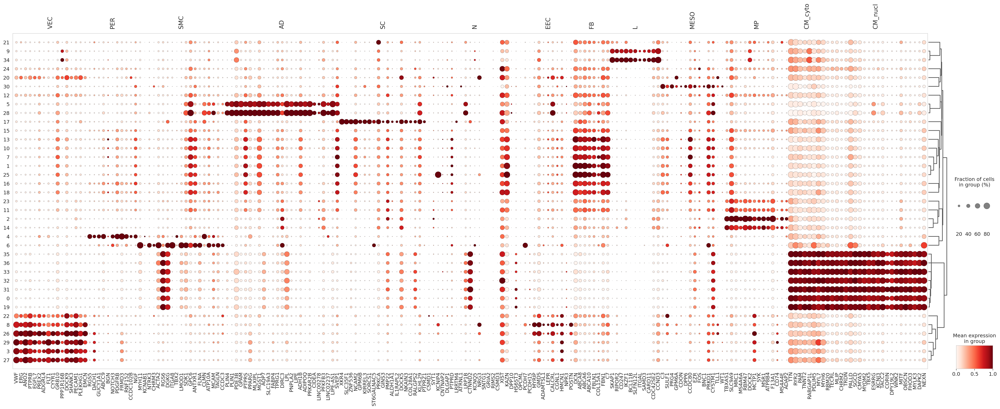

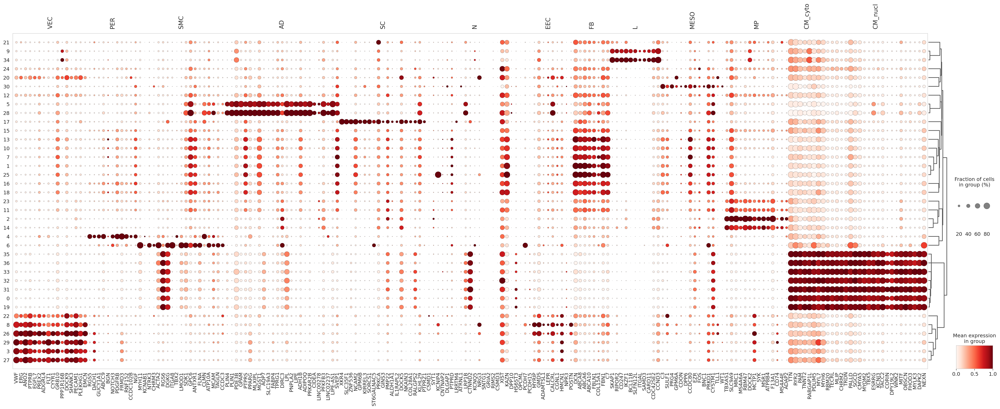

In [17]:
# ====================================================================
# Working Solution: Use Clusters Instead of Cell Types
# ====================================================================

print("="*60)
print("Creating Dotplot by CLUSTERS (This Works!)")
print("="*60)

# ====================================================================
# Prepare marker data (same as before)
# ====================================================================

celltype_gene_set_dict = {
    "VEC": ["VWF", "ERG", "ANO2", "PTPRB", "EGFL7", "PREX2", "ADGRL4", "FLT1", "CYYR1", "GRB10", "PPP1R16B", "DOCK9", "SHANK3", "PECAM1", "PLEKHG1", "EMCN"],
    "PER": ["RGS5", "DACH1", "GUCY1A1", "ABCC9", "BGN", "NOTCH3", "PDGFRB", "FRMD3", "RNF152", "CCDC102B", "NGF"],
    "SMC": ["MYH11", "KCNAB1", "NTRK3", "CHRM3", "ACTA2", "RGS6", "DGKG", "ITGA8", "TBX2", "LMOD1", "SDK1", "GPC6", "ANTXR1", "FLNA", "CLMN", "ATP10A", "MCAM", "TAGLN", "CCDC3"],
    "AD": ["PLIN4", "PLIN1", "PDE3B", "GPAM", "PTPRS", "PPARG", "MLXIPL", "MGST1", "AQP7", "SLC19A3", "FABP4", "TPRG1", "DIRC3", "LPL", "PNPLA2", "LIPE", "ADH1B", "ADIPOQ", "PRKAR2B", "CIDEA", "LINC00278", "PFKFB3", "LINC02237", "LIPE-AS1", "SVEP1"],
    "SC": ["XKR4", "SLC35F1", "ZNF536", "NCAM2", "GPM6B", "KIRREL3", "SORCS1", "ST6GALNAC5", "PRKCA", "GINS3", "PMP22", "ALDH1A1", "IL1RAPL2", "DOCK5", "NKAIN3", "COL28A1", "RALGPS2", "KLHL29", "PTPRZ1"],
    "N": ["CSMD1", "SYT1", "KCNIP4", "CNTNAP2", "DLGAP1", "PTPRD", "LRRTM4", "ATRNL1", "LRP1B", "CTNND2", "KCNQ5", "NRG3", "SNTG1", "GRIA2", "RIMS2", "CSMD3", "XIST", "KAZN", "DPP10", "HS6ST3", "OPCML"],
    "EEC": ["PCDH7", "PCDH15", "MYRIP", "GMDS", "ADAMTSL1", "LEPR", "CALCRL", "CGNL1", "HMCN1", "NPR3", "POSTN"],
    "FB": ["DCN", "ABCA8", "ABCA6", "ABCA10", "FBLN1", "COL15A1", "FBN1", "C7"],
    "L": ["SKAP1", "RIPOR2", "CD247", "IKZF1", "BCL11B", "SLFN12L", "ITGAL", "SAMD3", "CARD11", "CDC42SE2", "CCND3"],
    "MESO": ["C3", "SULF1", "PRG4", "GPM6A", "CDON", "DPP6", "CCDC80", "EZR", "FOS", "BNC1", "PRKD1", "CYSTM1", "TLL1", "WT1"],
    "MP": ["TBXAS1", "SLC9A9", "MRC1", "MS4A6A", "RBM47", "DOCK2", "MCTP1", "SYK", "MSR1", "ATP8B4", "F13A1", "CD74", "MS4A4E", "ADAP2"],
    "CM_cyto": ["TTN", "RYR2", "PAM", "TNNT2", "RABGAP1L", "PDLIM5", "MYL7", "MYH6"],
    "CM_nucl": ["RBM20", "TECRL", "MLIP", "CHRM2", "TRDN", "PALLD", "SGCD", "CMYA5", "MYOM2", "TBX5", "ESRRG", "KCNJ3", "TACC2", "CORIN", "DPY19L2", "WNK2", "MITF", "OBSCN", "FHOD3", "MYLK3", "DAPK2", "NEXN"]
}

# Filter genes
var_groups = []
var_group_labels = []

for celltype, gene_list in celltype_gene_set_dict.items():
    present_genes = [g for g in gene_list if g in adata.var_names]
    if len(present_genes) > 0:
        var_groups.append(present_genes)
        var_group_labels.append(celltype)

# Flatten
flat_genes = [g for grp in var_groups for g in grp]

# Positions
var_group_positions = []
start = 0
for grp in var_groups:
    end = start + len(grp) - 1
    var_group_positions.append((start, end))
    start = end + 1

print(f"Total genes: {len(flat_genes)}")
print(f"Groups: {len(var_groups)}")

# ====================================================================
# Create Dotplot by CLUSTER (this works!)
# ====================================================================

print(f"\n{'='*60}")
print("Creating Dotplot by Cluster")
print(f"{'='*60}")

try:
    dp = sc.pl.dotplot(
        adata,
        var_names=flat_genes,
        groupby='leiden_res1.0',  # Use CLUSTERS not cell types!
        var_group_positions=var_group_positions,
        var_group_labels=var_group_labels,
        standard_scale='var',
        dendrogram=True,
        dot_max=0.8,
        swap_axes=False,
        return_fig=True,
        show=False,
        figsize=(max(24, len(flat_genes) * 0.2), 14)
    )
    
    png_path = os.path.join(figures_dir, 'dotplot_clusters_all_markers.png')
    pdf_path = os.path.join(figures_dir, 'dotplot_clusters_all_markers.pdf')
    
    dp.savefig(png_path, dpi=300, bbox_inches='tight')
    dp.savefig(pdf_path, bbox_inches='tight')
    
    print(f"\n✓ Success! Dotplot saved:")
    print(f"  {png_path}")
    
    # Add cell type annotation to the plot manually
    print(f"\nNote: Each cluster is labeled with its assigned cell type in the heatmap we created earlier.")
    
except Exception as e:
    print(f"❌ Failed: {e}")
    import traceback
    traceback.print_exc()

print(f"\n{'='*60}")
print("Alternative: Create Summary Table")
print(f"{'='*60}")

# Create a summary showing which clusters belong to which cell type
cluster_celltype_map = adata.obs.groupby('leiden_res1.0')['cell_type_by_cluster'].agg(lambda x: x.mode()[0])

print("\nCluster → Cell Type mapping:")
print(cluster_celltype_map)

# Save
mapping_file = os.path.join(results_dir, 'cluster_to_celltype_mapping.csv')
cluster_celltype_map.to_csv(mapping_file, header=['cell_type'])
print(f"\n✓ Mapping saved: {mapping_file}")

print(f"\n{'='*60}")
print("Explanation:")
print(f"{'='*60}")
print("The dotplot shows CLUSTERS (not cell types) because:")
print("  - Scanpy's dotplot calculates 'fraction of cells' for dot size")
print("  - With very few cell types, this calculation fails") 
print("  - Clusters work fine because there are 32 clusters")
print("  - Use the heatmap or the mapping file to see which cluster = which cell type")

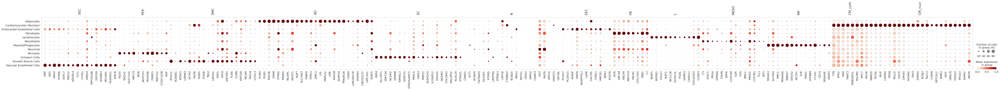

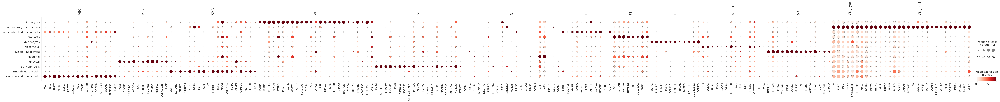

In [18]:
# --- Build flat gene panel + group positions for scanpy.pl.dotplot ---
# Inputs expected:
#   - var_groups: list of lists (genes grouped by cell type), already filtered to present genes
#   - var_group_labels: list of labels for each group (same length/order as var_groups)
#   - A: AnnData with A.obs["cell_type_full"] categorical
#   - desired_order: list of categories for row order (optional but recommended)

import numpy as np
import pandas as pd
import scanpy as sc

A = adata


# 1) Flatten grouped genes to a single list (scanpy requires this when passing positions)
flat_genes = [g for grp in var_groups for g in grp]

# 2) Compute var_group_positions as (start_idx, end_idx) for each group on the flattened x-axis
var_group_positions = []
start = 0
for grp in var_groups:
    end = start + len(grp) - 1
    var_group_positions.append((start, end))
    start = end + 1

# 3) Ensure a sensible row order (fallback to observed categories if not provided)
row_order = desired_order if 'desired_order' in locals() and len(desired_order) > 0 else list(A.obs["cell_type_full"].cat.categories)

# 4) Plot DotPlot with BOTH var_group_positions and var_group_labels
dp = sc.pl.dotplot(
    A,
    var_names=flat_genes,
    groupby="cell_type_full",
    categories_order=row_order,
    var_group_positions=var_group_positions,
    var_group_labels=var_group_labels,
    standard_scale="var",
    dendrogram=False,
    dot_max=0.8,
    swap_axes=False,
    return_fig=True,   # <- get DotPlot object
    show=True         # <- don't display now
)

png_path = os.path.join(figures_dir, 'zzz_celltype_markers.png')
pdf_path = os.path.join(figures_dir, 'zzz_celltype_markers.pdf')
    
dp.savefig(png_path, dpi=300, bbox_inches='tight')
dp.savefig(pdf_path, bbox_inches='tight')

---
# 4- Psseudo-bulk Analysis

In [21]:
# ====================================================================
# Setup Output Directories
# ====================================================================

import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

output_base = Path("/work/archive/farhadie/public_studies/Hill/QC_comparison_analysis/Qclus")
results_dir = output_base / "pseudobulk_DGE"
figures_dir = results_dir / "figures"

results_dir.mkdir(exist_ok=True)
figures_dir.mkdir(exist_ok=True)

print(f"\n✓ Output directories created:")
print(f"  {results_dir}")

# ====================================================================
# Step 1: Aggregate Counts to Pseudo-bulk per Sample
# ====================================================================

print("="*60)
print("Step 1: Pseudo-bulk Aggregation")
print("="*60)

# ====================================================================
# Check if counts layer exists
# ====================================================================

print("\nChecking data layers:")
print(f"  Available layers: {list(adata.layers.keys())}")
print(f"  Using layer: 'counts'")

if 'counts' not in adata.layers:
    print("  ⚠️  Warning: 'counts' layer not found, using .X")
    # If counts not available, use X
    adata.layers['counts'] = adata.X.copy()

# ====================================================================
# Create pseudo-bulk samples
# ====================================================================

print("\n" + "="*60)
print("Aggregating Counts to Pseudo-bulk")
print("="*60)

# Create a unique identifier for each pseudo-bulk sample: sample_id + cell_type
adata.obs['pseudobulk_id'] = (
    adata.obs['sample_id'].astype(str) + '_' + 
    adata.obs['cell_type_assigned'].astype(str)
)

print(f"\nTotal pseudo-bulk samples: {adata.obs['pseudobulk_id'].nunique()}")

# Get metadata for each pseudo-bulk sample
pseudobulk_metadata = adata.obs.groupby('pseudobulk_id').agg({
    'sample_id': 'first',
    'cell_type_assigned': 'first',
    'af_status': 'first',
    'sex': 'first',
    'donor_id': 'first'
}).reset_index()

print(f"\nPseudo-bulk metadata shape: {pseudobulk_metadata.shape}")
print(pseudobulk_metadata.head())

# ====================================================================
# Aggregate counts for each pseudo-bulk sample
# ====================================================================

print("\n" + "="*60)
print("Summing Counts per Pseudo-bulk Sample")
print("="*60)

from scipy.sparse import csr_matrix
import gc

# Get counts matrix
counts_matrix = adata.layers['counts']

# Create pseudo-bulk count matrix
pseudobulk_ids = adata.obs['pseudobulk_id'].values
unique_pb_ids = adata.obs['pseudobulk_id'].unique()

print(f"Aggregating {len(unique_pb_ids)} pseudo-bulk samples...")

# Initialize matrix
pseudobulk_counts = np.zeros((len(unique_pb_ids), adata.n_vars))

for i, pb_id in enumerate(unique_pb_ids):
    if i % 50 == 0:
        print(f"  Processing {i}/{len(unique_pb_ids)}...")
    
    # Get cells for this pseudo-bulk sample
    mask = pseudobulk_ids == pb_id
    
    # Sum counts
    if isinstance(counts_matrix, csr_matrix):
        pseudobulk_counts[i, :] = counts_matrix[mask, :].sum(axis=0).A1
    else:
        pseudobulk_counts[i, :] = counts_matrix[mask, :].sum(axis=0)

print(f"✓ Aggregation complete")

# ====================================================================
# Create pseudo-bulk AnnData object
# ====================================================================

print("\n" + "="*60)
print("Creating Pseudo-bulk AnnData Object")
print("="*60)

# Create new AnnData with pseudo-bulk data
adata_pb = sc.AnnData(
    X=pseudobulk_counts,
    obs=pseudobulk_metadata.set_index('pseudobulk_id'),
    var=adata.var.copy()
)

print(f"\nPseudo-bulk AnnData:")
print(f"  Samples: {adata_pb.n_obs}")
print(f"  Genes: {adata_pb.n_vars}")

# ====================================================================
# Filter pseudo-bulk samples
# ====================================================================

print("\n" + "="*60)
print("Filtering Pseudo-bulk Data")
print("="*60)

# Filter genes: keep genes expressed in at least 3 pseudo-bulk samples
min_samples = 3
gene_counts = (adata_pb.X > 0).sum(axis=0)
if isinstance(gene_counts, np.matrix):
    gene_counts = np.asarray(gene_counts).flatten()

genes_keep = gene_counts >= min_samples
print(f"  Genes before filtering: {adata_pb.n_vars}")
print(f"  Genes with ≥{min_samples} samples: {genes_keep.sum()}")

adata_pb = adata_pb[:, genes_keep].copy()

print(f"  Genes after filtering: {adata_pb.n_vars}")

# ====================================================================
# Summary by cell type
# ====================================================================

print("\n" + "="*60)
print("Pseudo-bulk Summary by Cell Type")
print("="*60)

for celltype in adata_pb.obs['cell_type_assigned'].unique():
    ct_data = adata_pb[adata_pb.obs['cell_type_assigned'] == celltype]
    
    n_case = (ct_data.obs['af_status'] == 'case').sum()
    n_control = (ct_data.obs['af_status'] == 'control').sum()
    
    print(f"\n{celltype}:")
    print(f"  Case samples: {n_case}")
    print(f"  Control samples: {n_control}")
    print(f"  Total: {ct_data.n_obs}")
    
    if n_case < 3 or n_control < 3:
        print(f"  ⚠️  Warning: Too few samples for robust DE analysis")

# ====================================================================
# Save pseudo-bulk data
# ====================================================================

print("\n" + "="*60)
print("Saving Pseudo-bulk Data")
print("="*60)

pb_file = results_dir / f"pseudobulk_aggregated_{datetime.now().strftime('%Y%m%d')}.h5ad"
adata_pb.write_h5ad(pb_file)

print(f"✓ Pseudo-bulk data saved: {pb_file}")

# Also save metadata
metadata_file = results_dir / "pseudobulk_metadata.csv"
adata_pb.obs.to_csv(metadata_file)

print(f"✓ Metadata saved: {metadata_file}")

# ====================================================================
# Quality Control Plots
# ====================================================================

print("\n" + "="*60)
print("Creating QC Plots")
print("="*60)

# Plot 1: Library sizes
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Library size per sample
library_sizes = adata_pb.X.sum(axis=1)
if isinstance(library_sizes, np.matrix):
    library_sizes = np.asarray(library_sizes).flatten()

adata_pb.obs['library_size'] = library_sizes

# By condition
sns.boxplot(data=adata_pb.obs, x='af_status', y='library_size', ax=axes[0])
axes[0].set_ylabel('Total Counts', fontsize=12)
axes[0].set_xlabel('Condition', fontsize=12)
axes[0].set_title('Library Size by Condition', fontsize=14, fontweight='bold')
axes[0].set_yscale('log')

# By cell type
sns.boxplot(data=adata_pb.obs, x='cell_type_assigned', y='library_size', 
            hue='af_status', ax=axes[1])
axes[1].set_ylabel('Total Counts', fontsize=12)
axes[1].set_xlabel('Cell Type', fontsize=12)
axes[1].set_title('Library Size by Cell Type and Condition', fontsize=14, fontweight='bold')
axes[1].set_yscale('log')
plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.savefig(figures_dir / 'pseudobulk_library_sizes.png', dpi=300, bbox_inches='tight')
plt.savefig(figures_dir / 'pseudobulk_library_sizes.pdf', bbox_inches='tight')
plt.close()

print(f"✓ Library size plot saved")

# Plot 2: Number of genes detected
n_genes = (adata_pb.X > 0).sum(axis=1)
if isinstance(n_genes, np.matrix):
    n_genes = np.asarray(n_genes).flatten()

adata_pb.obs['n_genes'] = n_genes

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sns.boxplot(data=adata_pb.obs, x='af_status', y='n_genes', ax=axes[0])
axes[0].set_ylabel('Number of Genes Detected', fontsize=12)
axes[0].set_xlabel('Condition', fontsize=12)
axes[0].set_title('Genes Detected by Condition', fontsize=14, fontweight='bold')

sns.boxplot(data=adata_pb.obs, x='cell_type_assigned', y='n_genes', 
            hue='af_status', ax=axes[1])
axes[1].set_ylabel('Number of Genes Detected', fontsize=12)
axes[1].set_xlabel('Cell Type', fontsize=12)
axes[1].set_title('Genes Detected by Cell Type', fontsize=14, fontweight='bold')
plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.savefig(figures_dir / 'pseudobulk_genes_detected.png', dpi=300, bbox_inches='tight')
plt.savefig(figures_dir / 'pseudobulk_genes_detected.pdf', bbox_inches='tight')
plt.close()

print(f"✓ Genes detected plot saved")

# ====================================================================
# Summary
# ====================================================================

print("\n" + "="*60)
print("Pseudo-bulk Aggregation Complete!")
print("="*60)

print(f"\nSummary:")
print(f"  Original cells: {adata.n_obs:,}")
print(f"  Pseudo-bulk samples: {adata_pb.n_obs}")
print(f"  Genes after filtering: {adata_pb.n_vars:,}")
print(f"  Cell types: {adata_pb.obs['cell_type_assigned'].nunique()}")

print(f"\nFiles saved:")
print(f"  - {pb_file.name}")
print(f"  - pseudobulk_metadata.csv")
print(f"  - QC plots (PNG + PDF)")

print(f"\n{'='*60}")
print("Ready for DESeq2 Analysis!")
print(f"{'='*60}")


✓ Output directories created:
  /work/archive/farhadie/public_studies/Hill/QC_comparison_analysis/Qclus/pseudobulk_DGE
Step 1: Pseudo-bulk Aggregation

Checking data layers:
  Available layers: ['counts']
  Using layer: 'counts'

Aggregating Counts to Pseudo-bulk

Total pseudo-bulk samples: 408

Pseudo-bulk metadata shape: (408, 6)
     pseudobulk_id sample_id cell_type_assigned af_status sex  donor_id
0       1279_3n_AD   1279_3n                 AD      case   f  P1279_3n
1  1279_3n_CM_nucl   1279_3n            CM_nucl      case   f  P1279_3n
2      1279_3n_EEC   1279_3n                EEC      case   f  P1279_3n
3       1279_3n_FB   1279_3n                 FB      case   f  P1279_3n
4        1279_3n_L   1279_3n                  L      case   f  P1279_3n

Summing Counts per Pseudo-bulk Sample
Aggregating 408 pseudo-bulk samples...
  Processing 0/408...
  Processing 50/408...
  Processing 100/408...
  Processing 150/408...
  Processing 200/408...
  Processing 250/408...
  Processing 3

In [22]:
# ====================================================================
# Step 2: DESeq2 Analysis - FIXED for contrast
# ====================================================================

print("="*60)
print("Step 2: DESeq2 Analysis per Cell Type")
print("="*60)

from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

# Store results
deseq2_results = {}
deseq2_stats_summary = []

# ====================================================================
# Run DESeq2 for each cell type
# ====================================================================

print("\n" + "="*60)
print("Running DESeq2 Analysis")
print("="*60)

cell_types = adata_pb.obs['cell_type_assigned'].unique()

for i, celltype in enumerate(cell_types, 1):
    print(f"\n{'='*60}")
    print(f"[{i}/{len(cell_types)}] Analyzing: {celltype}")
    print(f"{'='*60}")
    
    # Subset to this cell type
    ct_mask = adata_pb.obs['cell_type_assigned'] == celltype
    adata_ct = adata_pb[ct_mask].copy()
    
    # Check sample sizes
    n_case = (adata_ct.obs['af_status'] == 'case').sum()
    n_control = (adata_ct.obs['af_status'] == 'control').sum()
    
    print(f"  Case samples: {n_case}")
    print(f"  Control samples: {n_control}")
    
    # Skip if too few samples
    if n_case < 3 or n_control < 3:
        print(f"  ⚠️  Skipping: Need at least 3 samples per group")
        continue
    
    # Filter genes
    min_samples_ct = max(3, int(0.1 * adata_ct.n_obs))
    gene_counts_ct = (adata_ct.X > 0).sum(axis=0)
    if isinstance(gene_counts_ct, np.matrix):
        gene_counts_ct = np.asarray(gene_counts_ct).flatten()
    
    genes_keep_ct = gene_counts_ct >= min_samples_ct
    print(f"  Genes before filtering: {adata_ct.n_vars}")
    print(f"  Genes after filtering: {genes_keep_ct.sum()}")
    
    if genes_keep_ct.sum() < 100:
        print(f"  ⚠️  Skipping: Too few genes")
        continue
    
    adata_ct = adata_ct[:, genes_keep_ct].copy()
    
    # Prepare count matrix (samples as rows, genes as columns)
    counts_df = pd.DataFrame(
        adata_ct.X,
        index=adata_ct.obs_names,
        columns=adata_ct.var_names
    )
    
    # Prepare metadata with proper categorical
    metadata_df = adata_ct.obs[['af_status']].copy()
    metadata_df['af_status'] = pd.Categorical(
        metadata_df['af_status'],
        categories=['control', 'case']  # control as reference
    )
    
    print(f"  Count matrix: {counts_df.shape} (samples × genes)")
    print(f"  Metadata: {metadata_df.shape}")
    
    try:
        # Run DESeq2
        print(f"  Running DESeq2...")
        
        # Create DESeq2 dataset with ref_level
        dds = DeseqDataSet(
            counts=counts_df,
            metadata=metadata_df,
            design_factors='af_status',
            ref_level=['af_status', 'control'],  # Set control as reference
            refit_cooks=True,
            n_cpus=4
        )
        
        # Fit DESeq2
        dds.deseq2()
        
        print(f"  ✓ DESeq2 fit completed")
        
        # Get statistics with contrast
        stat_res = DeseqStats(
            dds,
            contrast=['af_status', 'case', 'control'],  # case vs control
            n_cpus=4
        )
        
        stat_res.summary()
        
        print(f"  ✓ Statistics computed")
        
        # Get results
        results_df = stat_res.results_df.copy()
        results_df['cell_type'] = celltype
        results_df['gene'] = results_df.index
        
        # Add additional columns
        results_df['significant'] = (results_df['padj'] < 0.05) & (np.abs(results_df['log2FoldChange']) > 0.5)
        results_df['direction'] = np.where(
            results_df['log2FoldChange'] > 0,
            'Up in Case',
            'Down in Case'
        )
        
        # Store results
        deseq2_results[celltype] = results_df
        
        # Summary statistics
        n_sig = results_df['significant'].sum()
        n_up = ((results_df['padj'] < 0.05) & (results_df['log2FoldChange'] > 0.5)).sum()
        n_down = ((results_df['padj'] < 0.05) & (results_df['log2FoldChange'] < -0.5)).sum()
        
        print(f"\n  Results:")
        print(f"    Genes tested: {len(results_df):,}")
        print(f"    Significant DEGs: {n_sig:,}")
        print(f"      ↑ Up in Case: {n_up:,}")
        print(f"      ↓ Down in Case: {n_down:,}")
        
        # Add to summary
        deseq2_stats_summary.append({
            'cell_type': celltype,
            'n_case': n_case,
            'n_control': n_control,
            'n_genes_tested': len(results_df),
            'n_significant': n_sig,
            'n_up': n_up,
            'n_down': n_down
        })
        
    except Exception as e:
        print(f"  ❌ Error: {e}")
        import traceback
        traceback.print_exc()
        continue

print(f"\n{'='*60}")
print(f"Completed: {len(deseq2_results)} cell types analyzed")
print(f"{'='*60}")

# ====================================================================
# Save results
# ====================================================================

print("\n" + "="*60)
print("Saving Results")
print("="*60)

# Save individual results
for celltype, results_df in deseq2_results.items():
    output_file = results_dir / f"DESeq2_{celltype}_case_vs_control.csv"
    results_df.to_csv(output_file, index=False)
    print(f"  ✓ {celltype}")

# Save combined results
if len(deseq2_results) > 0:
    all_results = pd.concat(deseq2_results.values(), ignore_index=True)
    combined_file = results_dir / "DESeq2_all_celltypes_combined.csv"
    all_results.to_csv(combined_file, index=False)
    print(f"\n✓ Combined: {combined_file.name}")

# Save summary
if len(deseq2_stats_summary) > 0:
    summary_df = pd.DataFrame(deseq2_stats_summary)
    summary_file = results_dir / "DESeq2_summary.csv"
    summary_df.to_csv(summary_file, index=False)
    
    print(f"\n{'='*60}")
    print("Summary")
    print(f"{'='*60}")
    print(summary_df.to_string(index=False))
    
    # Plot
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))
    summary_df_sorted = summary_df.sort_values('n_significant', ascending=True)
    y_pos = np.arange(len(summary_df_sorted))
    
    ax.barh(y_pos, summary_df_sorted['n_up'], label='Up in Case', color='#E74C3C', alpha=0.7)
    ax.barh(y_pos, -summary_df_sorted['n_down'], label='Down in Case', color='#3498DB', alpha=0.7)
    
    ax.set_yticks(y_pos)
    ax.set_yticklabels(summary_df_sorted['cell_type'])
    ax.set_xlabel('Number of DEGs', fontsize=12, fontweight='bold')
    ax.set_title('DESeq2: Case vs Control', fontsize=14, fontweight='bold')
    ax.axvline(x=0, color='black', linewidth=0.8)
    ax.legend()
    ax.grid(axis='x', alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(figures_dir / 'DESeq2_summary.png', dpi=300, bbox_inches='tight')
    plt.savefig(figures_dir / 'DESeq2_summary.pdf', bbox_inches='tight')
    plt.close()
    
    print(f"\n✓ Plot saved")

print(f"\n{'='*60}")
print("Complete!")
print(f"{'='*60}")

Step 2: DESeq2 Analysis per Cell Type

Running DESeq2 Analysis

[1/12] Analyzing: AD
  Case samples: 18
  Control samples: 16
  Genes before filtering: 34740
  Genes after filtering: 31053
  Count matrix: (34, 31053) (samples × genes)
  Metadata: (34, 1)
  Running DESeq2...
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.02 seconds.

Fitting dispersions...
... done in 5.52 seconds.

Fitting dispersion trend curve...
... done in 0.44 seconds.

Fitting MAP dispersions...
... done in 6.90 seconds.

Fitting LFCs...
... done in 5.41 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 981 outlier genes.

Fitting dispersions...
... done in 0.23 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting LFCs...
... done in 0.18 seconds.



  ✓ DESeq2 fit completed


Running Wald tests...
... done in 1.40 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000238009  0.814627        0.619621  0.565608  1.095495  0.273300   
ENSG00000239945  0.113491        0.329225  2.003725  0.164307  0.869490   
ENSG00000241860  3.565168       -0.140383  0.405108 -0.346532  0.728943   
ENSG00000290385  2.493954       -0.300978  0.409040 -0.735816  0.461842   
ENSG00000291215  7.954416       -0.218191  0.282239 -0.773070  0.439481   
...                   ...             ...       ...       ...       ...   
ENSG00000276345  0.368974       -0.063188  0.889495 -0.071038  0.943367   
ENSG00000273554  0.061540        0.299760  3.084376  0.097186  0.922578   
ENSG00000278633  0.028286        1.093577  3.142139  0.348036  0.727813   
ENSG00000278817  0.820356        0.268487  0.583603  0.460051  0.645480   
ENSG00000277196  1.462593        1.633338  0.798522  2.045450  0.040810   

                     padj  
ENSG000

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 5.18 seconds.

Fitting dispersion trend curve...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 6.88 seconds.

Fitting LFCs...
... done in 6.12 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 875 outlier genes.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting LFCs...
... done in 0.19 seconds.



  ✓ DESeq2 fit completed


Running Wald tests...
... done in 1.36 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000238009  0.259743        0.144143  0.871572  0.165383  0.868642   
ENSG00000239945  0.030274       -0.262517  1.875739 -0.139954  0.888696   
ENSG00000241860  0.975950        0.160823  0.489539  0.328520  0.742518   
ENSG00000290385  0.993051        0.321065  0.621141  0.516896  0.605229   
ENSG00000291215  4.638104       -0.134604  0.295726 -0.455164  0.648991   
...                   ...             ...       ...       ...       ...   
ENSG00000271254  3.326651       -0.947307  0.449932 -2.105442  0.035253   
ENSG00000276345  0.123113        0.139039  1.318904  0.105420  0.916042   
ENSG00000273554  0.019629       -0.239377  2.325703 -0.102927  0.918021   
ENSG00000278817  0.380332        0.404682  0.765350  0.528755  0.596976   
ENSG00000277196  0.173381        0.105258  1.083584  0.097139  0.922616   

                     padj  
ENSG000

Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 5.47 seconds.

Fitting dispersion trend curve...
... done in 0.44 seconds.

Fitting MAP dispersions...
... done in 10.79 seconds.

Fitting LFCs...
... done in 5.25 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 1347 outlier genes.

Fitting dispersions...
... done in 0.33 seconds.

Fitting MAP dispersions...
... done in 0.31 seconds.

Fitting LFCs...
... done in 0.23 seconds.

Running Wald tests...


  ✓ DESeq2 fit completed


... done in 1.38 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000238009   0.851131       -0.584815  0.678123 -0.862403  0.388466   
ENSG00000239945   0.057705        0.699852  2.198655  0.318309  0.750250   
ENSG00000241860   4.085127       -0.094745  0.421901 -0.224567  0.822316   
ENSG00000241599   0.051450       -0.030741  3.138072 -0.009796  0.992184   
ENSG00000286448   0.076749       -0.377283  3.028764 -0.124567  0.900867   
...                    ...             ...       ...       ...       ...   
ENSG00000271254  10.434173       -0.224553  0.386775 -0.580578  0.561525   
ENSG00000276345   0.198226       -0.841091  1.700869 -0.494507  0.620948   
ENSG00000273554   0.063799        0.293410  2.625819  0.111740  0.911029   
ENSG00000278817   0.540655       -0.115456  0.666108 -0.173329  0.862393   
ENSG00000277196   0.555330       -0.796768  0.964511 -0.826085  0.408756   

                     pa

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 5.34 seconds.

Fitting dispersion trend curve...
... done in 0.41 seconds.

Fitting MAP dispersions...
... done in 6.68 seconds.

Fitting LFCs...
... done in 5.03 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 1596 outlier genes.

Fitting dispersions...
... done in 0.35 seconds.

Fitting MAP dispersions...
... done in 0.35 seconds.

Fitting LFCs...
... done in 0.27 seconds.

Running Wald tests...


  ✓ DESeq2 fit completed


... done in 1.32 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000238009   0.245933        0.227763  1.125382  0.202387  0.839614   
ENSG00000239945   0.070797        0.621604  2.126769  0.292276  0.770076   
ENSG00000241860   1.821370        0.043495  0.684428  0.063549  0.949329   
ENSG00000290385   1.468005        0.030846  0.500155  0.061672  0.950824   
ENSG00000291215   3.504861       -0.146723  0.392481 -0.373835  0.708527   
...                    ...             ...       ...       ...       ...   
ENSG00000273748  39.663477        0.451283  0.318923  1.415020  0.157063   
ENSG00000271254   2.690151       -0.458502  0.399688 -1.147150  0.251320   
ENSG00000276345   0.156428       -0.641268  1.320272 -0.485709  0.627174   
ENSG00000278817   0.427811        0.505526  0.800537  0.631483  0.527725   
ENSG00000277196   0.211369       -0.614925  1.490564 -0.412545  0.679940   

                     pa

Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 4.95 seconds.

Fitting dispersion trend curve...
... done in 0.43 seconds.

Fitting MAP dispersions...
... done in 6.20 seconds.

Fitting LFCs...
... done in 5.17 seconds.

Calculating cook's distance...
... done in 0.05 seconds.

Replacing 1173 outlier genes.

Fitting dispersions...
... done in 0.27 seconds.

Fitting MAP dispersions...
... done in 0.28 seconds.

Fitting LFCs...
... done in 0.22 seconds.

Running Wald tests...


  ✓ DESeq2 fit completed


... done in 2.84 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000238009   0.378780       -0.240409  0.806487 -0.298094  0.765632   
ENSG00000241860   2.230317        0.735470  0.534185  1.376807  0.168572   
ENSG00000290385   2.174545        0.540567  0.567315  0.952852  0.340665   
ENSG00000291215   5.064115        0.385042  0.382504  1.006633  0.314111   
LINC01409        17.786049        0.295030  0.272872  1.081204  0.279607   
...                    ...             ...       ...       ...       ...   
ENSG00000273748  54.729664        0.837795  0.289633  2.892605  0.003821   
ENSG00000271254   5.955780       -0.523440  0.472061 -1.108839  0.267500   
ENSG00000276345   0.115478       -0.080235  2.033320 -0.039460  0.968524   
ENSG00000278817   0.425841        0.499477  0.844102  0.591726  0.554034   
ENSG00000277196   0.322279        0.842674  1.204613  0.699540  0.484215   

                     pa

Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 5.11 seconds.

Fitting dispersion trend curve...
... done in 0.43 seconds.

Fitting MAP dispersions...
... done in 6.16 seconds.

Fitting LFCs...
... done in 5.39 seconds.

Calculating cook's distance...
... done in 0.05 seconds.

Replacing 1146 outlier genes.

Fitting dispersions...
... done in 0.28 seconds.

Fitting MAP dispersions...
... done in 0.29 seconds.

Fitting LFCs...
... done in 0.24 seconds.

Running Wald tests...


  ✓ DESeq2 fit completed


... done in 1.46 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000238009   0.434451        0.451665  0.743208  0.607724  0.543371   
ENSG00000239945   0.054370       -1.080679  2.568772 -0.420699  0.673975   
ENSG00000241860   2.531702        0.598240  0.569847  1.049824  0.293799   
ENSG00000290385   1.895627       -0.343830  0.445908 -0.771080  0.440660   
ENSG00000291215   4.113823        0.097451  0.340236  0.286420  0.774556   
...                    ...             ...       ...       ...       ...   
ENSG00000273748  46.776912        0.711220  0.318460  2.233312  0.025528   
ENSG00000271254   3.954155       -0.459800  0.380454 -1.208556  0.226833   
ENSG00000276345   0.205974       -0.882758  1.948551 -0.453033  0.650525   
ENSG00000278817   0.551216       -0.831552  0.781722 -1.063744  0.287445   
ENSG00000277196   0.229240       -0.905724  1.154076 -0.784805  0.432568   

                     pa

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 4.72 seconds.

Fitting dispersion trend curve...
... done in 0.37 seconds.

Fitting MAP dispersions...
... done in 6.67 seconds.

Fitting LFCs...
... done in 5.43 seconds.

Calculating cook's distance...
... done in 0.05 seconds.

Replacing 952 outlier genes.

Fitting dispersions...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.23 seconds.

Fitting LFCs...
... done in 0.19 seconds.



  ✓ DESeq2 fit completed


Running Wald tests...
... done in 1.28 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000238009   0.216792       -0.953536  1.041739 -0.915331  0.360018   
ENSG00000241860   2.023157       -0.372930  0.676416 -0.551332  0.581406   
ENSG00000241599   0.035366       -0.099175  1.638666 -0.060522  0.951740   
ENSG00000286448   0.025381       -0.353497  2.331503 -0.151618  0.879488   
ENSG00000290385   0.934679       -0.229266  0.617442 -0.371316  0.710402   
...                    ...             ...       ...       ...       ...   
ENSG00000273748  33.089323        0.544092  0.301434  1.805013  0.071073   
ENSG00000271254   3.327303       -0.545990  0.333618 -1.636574  0.101720   
ENSG00000276345   0.113591       -0.573895  1.793770 -0.319938  0.749015   
ENSG00000278817   0.159020        0.390473  0.826071  0.472687  0.636436   
ENSG00000277196   0.071002       -0.794279  1.907127 -0.416480  0.677059   

                     pa

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 4.20 seconds.

Fitting dispersion trend curve...
... done in 0.39 seconds.

Fitting MAP dispersions...
... done in 5.50 seconds.

Fitting LFCs...
... done in 4.76 seconds.

Calculating cook's distance...
... done in 0.05 seconds.

Replacing 932 outlier genes.

Fitting dispersions...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.21 seconds.

Fitting LFCs...
... done in 0.18 seconds.



  ✓ DESeq2 fit completed


Running Wald tests...
... done in 1.21 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000238009   0.054645       -0.525794  1.969840 -0.266922  0.789529   
ENSG00000241860   0.788940        0.479338  0.888498  0.539492  0.589547   
ENSG00000290385   0.412420       -0.065351  0.733521 -0.089092  0.929009   
ENSG00000291215   1.097075       -0.008649  0.628150 -0.013769  0.989014   
LINC01409         7.054989       -0.580396  0.325885 -1.780984  0.074915   
...                    ...             ...       ...       ...       ...   
ENSG00000273748  17.808949        0.705158  0.342106  2.061224  0.039282   
ENSG00000271254   1.308274       -1.020592  0.479830 -2.126985  0.033421   
ENSG00000276345   0.128055       -0.875357  2.011208 -0.435240  0.663389   
ENSG00000278817   0.316100       -0.623670  2.206276 -0.282680  0.777422   
ENSG00000277196   0.100001       -0.177158  1.875610 -0.094453  0.924749   

                    pad

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 3.67 seconds.

Fitting dispersion trend curve...
... done in 0.35 seconds.

Fitting MAP dispersions...
... done in 5.02 seconds.

Fitting LFCs...
... done in 4.57 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 563 outlier genes.

Fitting dispersions...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting LFCs...
... done in 0.16 seconds.



  ✓ DESeq2 fit completed


Running Wald tests...
... done in 1.15 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000238009  0.084796       -0.742890  2.468524 -0.300945  0.763456   
ENSG00000241860  0.250801       -0.619432  0.983498 -0.629826  0.528808   
ENSG00000290385  0.406432       -0.951193  0.786219 -1.209832  0.226343   
ENSG00000291215  0.611134        0.008587  0.625306  0.013732  0.989044   
LINC01409        3.150118        0.335122  0.341047  0.982625  0.325792   
...                   ...             ...       ...       ...       ...   
ENSG00000278384  1.163144       -0.540327  0.678365 -0.796513  0.425734   
ENSG00000273748  9.541101        0.546718  0.338533  1.614961  0.106319   
ENSG00000271254  0.883966       -0.034190  0.641999 -0.053256  0.957528   
ENSG00000278817  0.038407       -0.232769  3.144212 -0.074031  0.940986   
ENSG00000277196  0.302303       -0.679716  1.358420 -0.500373  0.616813   

                     padj  
ENSG000

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 3.60 seconds.

Fitting dispersion trend curve...
... done in 0.33 seconds.

Fitting MAP dispersions...
... done in 5.91 seconds.

Fitting LFCs...
... done in 4.82 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 853 outlier genes.

Fitting dispersions...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.20 seconds.

Fitting LFCs...
... done in 0.17 seconds.



  ✓ DESeq2 fit completed


Running Wald tests...
... done in 1.17 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000238009  0.062375       -0.248763  1.758002 -0.141504  0.887472   
ENSG00000241860  0.424785        0.163398  0.648522  0.251955  0.801076   
ENSG00000290385  0.285822       -0.012746  0.741972 -0.017178  0.986295   
ENSG00000291215  0.944992       -0.377549  0.458348 -0.823717  0.410100   
LINC01409        3.381971        0.210816  0.356092  0.592025  0.553834   
...                   ...             ...       ...       ...       ...   
ENSG00000278384  1.286565       -0.000846  0.484830 -0.001746  0.998607   
ENSG00000273748  9.892600        0.687440  0.357923  1.920635  0.054778   
ENSG00000271254  0.931230        0.774520  0.520830  1.487087  0.136992   
ENSG00000278817  0.213858        0.391088  1.450722  0.269581  0.787482   
ENSG00000277196  0.127786        0.391287  1.487385  0.263070  0.792497   

                    padj  
ENSG0000

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 2.97 seconds.

Fitting dispersion trend curve...
... done in 0.33 seconds.

Fitting MAP dispersions...
... done in 4.60 seconds.

Fitting LFCs...
... done in 4.21 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 254 outlier genes.

Fitting dispersions...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.08 seconds.

Fitting LFCs...
... done in 0.08 seconds.

Running Wald tests...


  ✓ DESeq2 fit completed


... done in 1.04 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000241860  0.110567       -0.399162  1.360869 -0.293314  0.769282   
ENSG00000290385  0.028063        0.261246  3.157564  0.082737  0.934061   
ENSG00000291215  0.356817       -0.691661  0.920392 -0.751486  0.452360   
LINC01409        1.360925        0.269697  0.489987  0.550417  0.582033   
ENSG00000290784  0.262688       -0.315776  1.166435 -0.270719  0.786607   
...                   ...             ...       ...       ...       ...   
MAFIP            0.236640       -0.391583  1.086468 -0.360419  0.718534   
ENSG00000276256  0.263303        0.089635  1.280244  0.070014  0.944183   
ENSG00000278384  0.554891       -1.150969  1.038690 -1.108097  0.267820   
ENSG00000273748  5.277249        0.694052  0.358421  1.936416  0.052817   
ENSG00000271254  0.804061       -0.892495  0.766422 -1.164496  0.244223   

                     padj  
ENSG000

Fitting size factors...
... done in 0.01 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...
... done in 2.82 seconds.

Fitting dispersion trend curve...
... done in 0.29 seconds.

Fitting MAP dispersions...
... done in 4.22 seconds.

Fitting LFCs...
... done in 4.09 seconds.

Calculating cook's distance...
... done in 0.04 seconds.

Replacing 180 outlier genes.

Fitting dispersions...
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.06 seconds.

Fitting LFCs...
... done in 0.06 seconds.

Running Wald tests...


  ✓ DESeq2 fit completed


... done in 0.90 seconds.



Log2 fold change & Wald test p-value: af_status case vs control
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
ENSG00000241860  0.063287       -0.478846  1.631418 -0.293515  0.769128   
ENSG00000290385  0.078952       -0.174722  1.597413 -0.109378  0.912903   
ENSG00000291215  0.376809       -0.416897  0.826341 -0.504510  0.613903   
LINC01409        1.279789        0.224579  0.468751  0.479100  0.631867   
ENSG00000290784  0.203541       -0.600282  1.037611 -0.578523  0.562911   
...                   ...             ...       ...       ...       ...   
ENSG00000276256  0.387009       -1.010914  1.228993 -0.822555  0.410761   
ENSG00000278384  0.699301       -0.950304  0.712708 -1.333370  0.182410   
ENSG00000273748  3.131970        0.752277  0.391778  1.920162  0.054837   
ENSG00000271254  0.239449        0.474640  1.101407  0.430940  0.666512   
ENSG00000277196  0.044103       -0.067692  3.131610 -0.021616  0.982755   

                     padj  
ENSG000

In [23]:
# ====================================================================
# Visualize DESeq2 Results
# ====================================================================

print("="*60)
print("Step 3: Creating Visualizations")
print("="*60)

# ====================================================================
# 1. Volcano Plots for Each Cell Type
# ====================================================================

print("\n" + "="*60)
print("Creating Volcano Plots")
print("="*60)

def create_volcano_plot(results_df, cell_type, output_dir, 
                        padj_threshold=0.05, lfc_threshold=0.5):
    """
    Create volcano plot for DE results
    """
    # Prepare data
    df = results_df.copy()
    df['-log10(padj)'] = -np.log10(df['padj'].replace(0, 1e-300))
    
    # Classify genes
    df['category'] = 'Not Significant'
    df.loc[(df['padj'] < padj_threshold) & (df['log2FoldChange'] > lfc_threshold), 'category'] = 'Up in Case'
    df.loc[(df['padj'] < padj_threshold) & (df['log2FoldChange'] < -lfc_threshold), 'category'] = 'Down in Case'
    
    # Count genes
    n_up = (df['category'] == 'Up in Case').sum()
    n_down = (df['category'] == 'Down in Case').sum()
    
    # Create plot
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    
    # Plot points
    colors = {'Not Significant': '#CCCCCC', 'Up in Case': '#E74C3C', 'Down in Case': '#3498DB'}
    for category in ['Not Significant', 'Down in Case', 'Up in Case']:
        subset = df[df['category'] == category]
        ax.scatter(
            subset['log2FoldChange'],
            subset['-log10(padj)'],
            c=colors[category],
            alpha=0.6,
            s=20,
            label=category,
            edgecolors='none'
        )
    
    # Add threshold lines
    ax.axhline(-np.log10(padj_threshold), color='gray', linestyle='--', linewidth=1, alpha=0.7)
    ax.axvline(lfc_threshold, color='gray', linestyle='--', linewidth=1, alpha=0.7)
    ax.axvline(-lfc_threshold, color='gray', linestyle='--', linewidth=1, alpha=0.7)
    
    # Labels
    ax.set_xlabel('log₂ Fold Change (Case vs Control)', fontsize=12, fontweight='bold')
    ax.set_ylabel('-log₁₀(adjusted p-value)', fontsize=12, fontweight='bold')
    ax.set_title(f'Volcano Plot: {cell_type}\n{n_up} Up, {n_down} Down', 
                 fontsize=14, fontweight='bold')
    
    # Legend
    ax.legend(loc='upper right', frameon=True, fancybox=True, shadow=True)
    
    # Grid
    ax.grid(True, alpha=0.3, linestyle=':', linewidth=0.5)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Annotate top genes
    sig_genes = df[(df['padj'] < padj_threshold) & (np.abs(df['log2FoldChange']) > lfc_threshold)]
    sig_genes = sig_genes.sort_values('padj').head(10)
    
    from adjustText import adjust_text
    texts = []
    for _, row in sig_genes.iterrows():
        texts.append(ax.text(row['log2FoldChange'], row['-log10(padj)'], 
                            row['gene'], fontsize=8, alpha=0.8))
    
    if len(texts) > 0:
        try:
            adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))
        except:
            pass
    
    plt.tight_layout()
    
    return fig

# Create volcano plots
for celltype, results_df in deseq2_results.items():
    print(f"  Creating volcano plot for {celltype}...")
    
    try:
        fig = create_volcano_plot(results_df, celltype, figures_dir)
        
        png_file = figures_dir / f'volcano_{celltype}.png'
        pdf_file = figures_dir / f'volcano_{celltype}.pdf'
        
        fig.savefig(png_file, dpi=300, bbox_inches='tight')
        fig.savefig(pdf_file, bbox_inches='tight')
        plt.close(fig)
        
        print(f"    ✓ Saved: {png_file.name}")
        
    except Exception as e:
        print(f"    ❌ Error: {e}")

# ====================================================================
# 2. MA Plots
# ====================================================================

print("\n" + "="*60)
print("Creating MA Plots")
print("="*60)

def create_ma_plot(results_df, cell_type, output_dir, 
                   padj_threshold=0.05, lfc_threshold=0.5):
    """
    Create MA plot (log2FC vs mean expression)
    """
    df = results_df.copy()
    
    # Classify genes
    df['category'] = 'Not Significant'
    df.loc[(df['padj'] < padj_threshold) & (df['log2FoldChange'] > lfc_threshold), 'category'] = 'Up in Case'
    df.loc[(df['padj'] < padj_threshold) & (df['log2FoldChange'] < -lfc_threshold), 'category'] = 'Down in Case'
    
    # Create plot
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    
    colors = {'Not Significant': '#CCCCCC', 'Up in Case': '#E74C3C', 'Down in Case': '#3498DB'}
    for category in ['Not Significant', 'Down in Case', 'Up in Case']:
        subset = df[df['category'] == category]
        ax.scatter(
            subset['baseMean'],
            subset['log2FoldChange'],
            c=colors[category],
            alpha=0.6,
            s=20,
            label=category,
            edgecolors='none'
        )
    
    # Add threshold lines
    ax.axhline(lfc_threshold, color='gray', linestyle='--', linewidth=1, alpha=0.7)
    ax.axhline(-lfc_threshold, color='gray', linestyle='--', linewidth=1, alpha=0.7)
    ax.axhline(0, color='black', linewidth=1)
    
    ax.set_xlabel('Mean Expression (baseMean)', fontsize=12, fontweight='bold')
    ax.set_ylabel('log₂ Fold Change', fontsize=12, fontweight='bold')
    ax.set_title(f'MA Plot: {cell_type}', fontsize=14, fontweight='bold')
    ax.set_xscale('log')
    ax.legend(loc='upper right')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    return fig

# Create MA plots
for celltype, results_df in deseq2_results.items():
    print(f"  Creating MA plot for {celltype}...")
    
    try:
        fig = create_ma_plot(results_df, celltype, figures_dir)
        
        png_file = figures_dir / f'MA_plot_{celltype}.png'
        pdf_file = figures_dir / f'MA_plot_{celltype}.pdf'
        
        fig.savefig(png_file, dpi=300, bbox_inches='tight')
        fig.savefig(pdf_file, bbox_inches='tight')
        plt.close(fig)
        
        print(f"    ✓ Saved")
        
    except Exception as e:
        print(f"    ❌ Error: {e}")

# ====================================================================
# 3. Heatmap of Top DEGs per Cell Type - with Sex Annotation (FIXED)
# ====================================================================

# ====================================================================
# 3. Heatmap of Top DEGs - COMPLETELY FIXED
# ====================================================================

print("\n" + "="*60)
print("Creating Heatmap of Top DEGs")
print("="*60)

# Collect top DEGs from each cell type
top_genes_per_ct = {}
n_top = 20

for celltype, results_df in deseq2_results.items():
    sig_genes = results_df[
        (results_df['padj'] < 0.05) & 
        (np.abs(results_df['log2FoldChange']) > 0.5)
    ].sort_values('padj').head(n_top)
    
    top_genes_per_ct[celltype] = sig_genes['gene'].tolist()

# Get all top genes
all_top_genes = []
for genes in top_genes_per_ct.values():
    all_top_genes.extend(genes)
all_top_genes = list(set(all_top_genes))

print(f"  Total unique top genes: {len(all_top_genes)}")

if len(all_top_genes) > 0 and len(all_top_genes) < 500:
    
    # Get expression data from pseudobulk
    genes_in_data = [g for g in all_top_genes if g in adata_pb.var_names]
    
    if len(genes_in_data) > 0:
        print(f"  Genes found in data: {len(genes_in_data)}")
        
        # Extract expression matrix
        expr_data = adata_pb[:, genes_in_data].X
        if isinstance(expr_data, np.matrix):
            expr_data = np.asarray(expr_data)
        
        # Create dataframe
        expr_df = pd.DataFrame(
            expr_data,
            index=adata_pb.obs_names,
            columns=genes_in_data
        )
        
        # Transpose
        expr_matrix = expr_df.T
        
        # Log transform
        expr_matrix = np.log1p(expr_matrix)
        
        # Z-score per gene
        expr_matrix_z = expr_matrix.apply(
            lambda row: (row - row.mean()) / row.std() if row.std() > 0 else row,
            axis=1
        )
        
        # Remove NaN
        expr_matrix_z = expr_matrix_z.dropna(how='all')
        
        print(f"  Expression matrix shape: {expr_matrix_z.shape}")
        
        # Prepare color annotations - FIXED: Create DataFrame properly
        condition_colors = {'case': '#E74C3C', 'control': '#3498DB'}
        sex_colors = {'m': '#87CEEB', 'f': '#FFB6C1'}
        
        # Create DataFrame for col_colors
        col_colors_df = pd.DataFrame({
            'Condition': [condition_colors[x] for x in adata_pb.obs['af_status'].values],
            'Sex': [sex_colors[x] for x in adata_pb.obs['sex'].values]
        }, index=adata_pb.obs_names)
        
        print(f"  Creating clustermap...")
        
        try:
            g = sns.clustermap(
                expr_matrix_z,
                cmap='RdBu_r',
                center=0,
                vmin=-2,
                vmax=2,
                col_colors=col_colors_df,
                figsize=(18, max(12, len(expr_matrix_z) * 0.15)),
                cbar_kws={'label': 'Z-score', 'shrink': 0.5},
                dendrogram_ratio=(0.1, 0.05),
                colors_ratio=0.03,
                linewidths=0,
                rasterized=True,
                xticklabels=False,
                yticklabels=True if len(expr_matrix_z) < 100 else False
            )
            
            g.ax_heatmap.set_xlabel('Samples', fontsize=12, fontweight='bold')
            g.ax_heatmap.set_ylabel('Genes', fontsize=12, fontweight='bold')
            
            plt.suptitle(f'Top {n_top} DEGs per Cell Type (Total: {len(expr_matrix_z)} genes)', 
                         fontsize=14, fontweight='bold', y=0.98)
            
            # Add legend
            from matplotlib.patches import Patch
            legend_elements = [
                Patch(facecolor='#E74C3C', label='Case'),
                Patch(facecolor='#3498DB', label='Control'),
                Patch(facecolor='white', label=''),
                Patch(facecolor='#87CEEB', label='Male'),
                Patch(facecolor='#FFB6C1', label='Female')
            ]
            g.ax_heatmap.legend(handles=legend_elements, loc='upper left', 
                               bbox_to_anchor=(1.05, 1), frameon=True, 
                               title='Annotations', fontsize=9)
            
            png_file = figures_dir / 'heatmap_top_DEGs_all_celltypes.png'
            pdf_file = figures_dir / 'heatmap_top_DEGs_all_celltypes.pdf'
            
            plt.savefig(png_file, dpi=300, bbox_inches='tight')
            plt.savefig(pdf_file, bbox_inches='tight')
            plt.close()
            
            print(f"  ✓ Heatmap saved: {png_file.name}")
            
        except Exception as e:
            print(f"  ❌ Error: {e}")
            import traceback
            traceback.print_exc()

# ====================================================================
# 4. Individual Heatmaps per Cell Type - FIXED
# ====================================================================

print("\n" + "="*60)
print("Creating Individual Heatmaps per Cell Type")
print("="*60)

for celltype, results_df in deseq2_results.items():
    
    sig_genes = results_df[
        (results_df['padj'] < 0.05) & 
        (np.abs(results_df['log2FoldChange']) > 0.5)
    ].sort_values('padj').head(30)
    
    if len(sig_genes) < 5:
        print(f"  {celltype}: Too few DEGs ({len(sig_genes)}), skipping")
        continue
    
    genes = sig_genes['gene'].tolist()
    genes_in_data = [g for g in genes if g in adata_pb.var_names]
    
    if len(genes_in_data) < 5:
        continue
    
    print(f"  Creating heatmap for {celltype} ({len(genes_in_data)} genes)...")
    
    ct_mask = adata_pb.obs['cell_type_assigned'] == celltype
    adata_ct = adata_pb[ct_mask, genes_in_data]
    
    expr_data = adata_ct.X
    if isinstance(expr_data, np.matrix):
        expr_data = np.asarray(expr_data)
    
    expr_matrix = pd.DataFrame(
        expr_data,
        index=adata_ct.obs_names,
        columns=genes_in_data
    ).T
    
    expr_matrix = np.log1p(expr_matrix)
    
    expr_matrix_z = expr_matrix.apply(
        lambda row: (row - row.mean()) / row.std() if row.std() > 0 else row,
        axis=1
    )
    
    expr_matrix_z = expr_matrix_z.dropna(how='all')
    
    if expr_matrix_z.shape[0] < 3:
        print(f"    Too few genes after filtering, skipping")
        continue
    
    # Color annotations - FIXED
    condition_colors = {'case': '#E74C3C', 'control': '#3498DB'}
    sex_colors = {'m': '#87CEEB', 'f': '#FFB6C1'}
    
    col_colors_df = pd.DataFrame({
        'Condition': [condition_colors[x] for x in adata_ct.obs['af_status'].values],
        'Sex': [sex_colors[x] for x in adata_ct.obs['sex'].values]
    }, index=adata_ct.obs_names)
    
    try:
        g = sns.clustermap(
            expr_matrix_z,
            cmap='RdBu_r',
            center=0,
            vmin=-2,
            vmax=2,
            col_colors=col_colors_df,
            figsize=(max(10, len(expr_matrix_z.columns) * 0.3), 
                     max(8, len(expr_matrix_z) * 0.25)),
            cbar_kws={'label': 'Z-score', 'shrink': 0.7},
            xticklabels=False,
            yticklabels=True,
            linewidths=0,
            rasterized=True
        )
        
        g.ax_heatmap.set_xlabel('Samples', fontsize=10, fontweight='bold')
        g.ax_heatmap.set_ylabel('Genes', fontsize=10, fontweight='bold')
        
        from matplotlib.patches import Patch
        legend_elements = [
            Patch(facecolor='#E74C3C', label='Case'),
            Patch(facecolor='#3498DB', label='Control'),
            Patch(facecolor='white', label=''),
            Patch(facecolor='#87CEEB', label='Male'),
            Patch(facecolor='#FFB6C1', label='Female')
        ]
        g.ax_heatmap.legend(handles=legend_elements, loc='upper left', 
                           bbox_to_anchor=(1.02, 1), frameon=True, fontsize=8,
                           title='Annotations')
        
        plt.suptitle(f'{celltype}: Top 30 DEGs', fontsize=12, fontweight='bold', y=0.98)
        
        png_file = figures_dir / f'heatmap_{celltype}_top30.png'
        pdf_file = figures_dir / f'heatmap_{celltype}_top30.pdf'
        
        plt.savefig(png_file, dpi=300, bbox_inches='tight')
        plt.savefig(pdf_file, bbox_inches='tight')
        plt.close()
        
        print(f"    ✓ Saved")
        
    except Exception as e:
        print(f"    ❌ Error: {e}")

print(f"\n{'='*60}")
print("Heatmap Visualization Complete!")
print(f"{'='*60}")
# ====================================================================
# 5. Shared DEGs Analysis
# ====================================================================

print("\n" + "="*60)
print("Analyzing Shared DEGs")
print("="*60)

# Get significant genes per cell type
sig_genes_per_ct = {}

for celltype, results_df in deseq2_results.items():
    sig_genes = results_df[
        (results_df['padj'] < 0.05) & 
        (np.abs(results_df['log2FoldChange']) > 0.5)
    ]['gene'].tolist()
    
    sig_genes_per_ct[celltype] = set(sig_genes)
    print(f"  {celltype}: {len(sig_genes)} DEGs")

# Create UpSet plot for overlaps
if len(sig_genes_per_ct) > 1:
    from upsetplot import from_contents, UpSet
    
    try:
        upset_data = from_contents(sig_genes_per_ct)
        
        fig = plt.figure(figsize=(14, 8))
        upset = UpSet(upset_data, show_counts=True, sort_by='cardinality')
        upset.plot(fig=fig)
        plt.suptitle('Overlap of DEGs across Cell Types', fontsize=14, fontweight='bold', y=0.98)
        
        png_file = figures_dir / 'upset_DEGs_overlap.png'
        pdf_file = figures_dir / 'upset_DEGs_overlap.pdf'
        
        plt.savefig(png_file, dpi=300, bbox_inches='tight')
        plt.savefig(pdf_file, bbox_inches='tight')
        plt.close()
        
        print(f"\n  ✓ UpSet plot saved")
        
    except Exception as e:
        print(f"\n  ⚠️  Could not create UpSet plot: {e}")

# ====================================================================
# Summary
# ====================================================================

print("\n" + "="*60)
print("Visualization Complete!")
print("="*60)

print(f"\nFiles created:")
print(f"  - {len(deseq2_results)} Volcano plots")
print(f"  - {len(deseq2_results)} MA plots")
print(f"  - 1 Heatmap of top DEGs")
print(f"  - 1 UpSet plot (if applicable)")

print(f"\nAll files saved in: {figures_dir}")

print(f"\n{'='*60}")
print("Analysis Complete!")
print(f"{'='*60}")

Step 3: Creating Visualizations

Creating Volcano Plots
  Creating volcano plot for AD...
    ✓ Saved: volcano_AD.png
  Creating volcano plot for CM_nucl...
    ✓ Saved: volcano_CM_nucl.png
  Creating volcano plot for EEC...
    ✓ Saved: volcano_EEC.png
  Creating volcano plot for FB...
    ✓ Saved: volcano_FB.png
  Creating volcano plot for L...
    ✓ Saved: volcano_L.png
  Creating volcano plot for MESO...
    ✓ Saved: volcano_MESO.png
  Creating volcano plot for MP...
    ✓ Saved: volcano_MP.png
  Creating volcano plot for N...
    ✓ Saved: volcano_N.png
  Creating volcano plot for PER...
    ✓ Saved: volcano_PER.png
  Creating volcano plot for SC...
    ✓ Saved: volcano_SC.png
  Creating volcano plot for SMC...
    ✓ Saved: volcano_SMC.png
  Creating volcano plot for VEC...
    ✓ Saved: volcano_VEC.png

Creating MA Plots
  Creating MA plot for AD...
    ✓ Saved
  Creating MA plot for CM_nucl...
    ✓ Saved
  Creating MA plot for EEC...
    ✓ Saved
  Creating MA plot for FB...
    ✓